## Libraries

In [1]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
%matplotlib inline

The following settings will improve the default style and font sizes for our charts.

In [2]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

## Step 1 - Download and Explore the Data


In [3]:
Xco2_L3_df = pd.read_csv('C:/Users/Ochibobo/Measuring_Carbon/csv_files/L3/Xco2_L3_2015_to_22.csv')

In [4]:
Xco2_L3_df

,longitude,latitude,xco2,Year,Month
0,-180.000,-90.0,394.634441,2015,January
1,-180.000,-89.5,394.612467,2015,January
2,-180.000,-89.0,394.587501,2015,January
3,-180.000,-88.5,394.566608,2015,January
4,-180.000,-88.0,394.563475,2015,January
...,...,...,...,...,...
17882491,179.375,88.0,419.348985,2022,February
17882492,179.375,88.5,419.363277,2022,February
17882493,179.375,89.0,419.358291,2022,February
17882494,179.375,89.5,419.332850,2022,February


### Scatter Plot

CPU times: total: 1.36 s
Wall time: 1.44 s


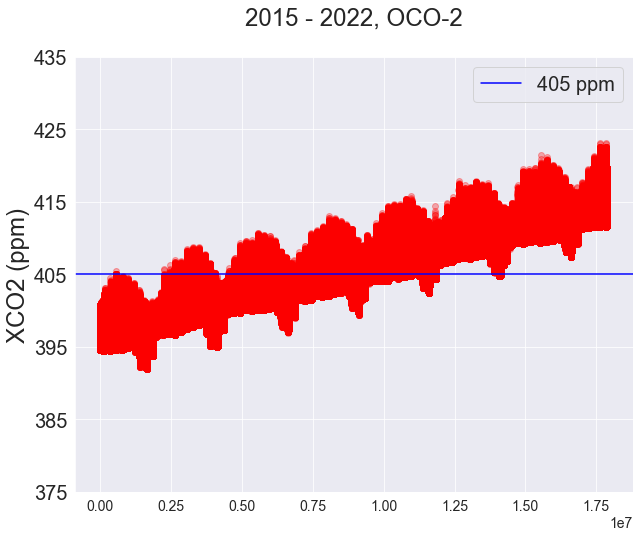

In [5]:
%%time
plt.scatter(x=np.arange(0, len(Xco2_L3_df)), y= Xco2_L3_df["xco2"], c='red', alpha=0.30 )
plt.axhline(y= 405, color='blue', label= '405 ppm')
plt.yticks(np.arange(375, 445, 10), fontsize= 20)
plt.title('2015 - 2022, OCO-2\n', fontsize= 24)
plt.legend(loc= 'upper right', prop={'size': 20})
plt.ylabel('XCO2 (ppm)', fontsize= 24)
plt.gcf().set_size_inches(10,8);

## Global average annual xco2 emissions

In [6]:
global_xco2_avg = Xco2_L3_df[['xco2', 'Year']].groupby(['Year']).mean().reset_index()
global_xco2_avg

,Year,xco2
0,2015,398.467399
1,2016,401.616738
2,2017,403.898588
3,2018,406.188272
4,2019,408.728774
5,2020,411.255476
6,2021,413.595746
7,2022,415.749999


### PPM to gtCO2

Using 5.137 x 10^18 kg as the mass of the atmosphere we know that 1 PPMV CO2=7.81 Gt CO2.

[Skeptical Science](https://skepticalscience.com/print.php?r=45)

Note that the conversion is different for Gigatonnes of Carbon Dioxide emissions, because natural sinks (ocean and biosphere) absorb approximately 55% of human emissions, so the "airborne fraction" added to the atmosphere is about 45%.  This means 1ppm = 17.3 Gigatonnes of Carbon Dioxide emissions.

In [7]:
global_xco2_avg['Gt_Co2'] = global_xco2_avg['xco2'] * 7.81
global_xco2_avg

,Year,xco2,Gt_Co2
0,2015,398.467399,3112.030387
1,2016,401.616738,3136.626722
2,2017,403.898588,3154.447969
3,2018,406.188272,3172.330406
4,2019,408.728774,3192.171727
5,2020,411.255476,3211.905264
6,2021,413.595746,3230.182778
7,2022,415.749999,3247.007492


## Global Power plant Databases

In [8]:
import pandas as pd

POWER_PLANT_URL = (
    "https://raw.githubusercontent.com/MarcSkovMadsen/awesome-streamlit/master/"
    "gallery/global_power_plant_database/global_power_plant_database.csv"
)

pp_data = pd.read_csv(POWER_PLANT_URL)
pp_data.head()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,url,geolocation_source,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.00,32.3220,65.1190,Hydro,NaN,NaN,...,http://globalenergyobservatory.org,GEODB,1009793,2017.0,NaN,NaN,NaN,NaN,NaN,NaN
1,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.00,34.5560,69.4787,Hydro,NaN,NaN,...,http://globalenergyobservatory.org,GEODB,1009795,2017.0,NaN,NaN,NaN,NaN,NaN,NaN
2,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.00,34.6410,69.7170,Hydro,NaN,NaN,...,http://globalenergyobservatory.org,GEODB,1009797,2017.0,NaN,NaN,NaN,NaN,NaN,NaN
3,AFG,Afghanistan,Nangarhar (Darunta) Hydroelectric Power Plant ...,GEODB0040536,11.55,34.4847,70.3633,Hydro,NaN,NaN,...,http://globalenergyobservatory.org,GEODB,1009787,2017.0,NaN,NaN,NaN,NaN,NaN,NaN
4,AFG,Afghanistan,Northwest Kabul Power Plant Afghanistan,GEODB0040540,42.00,34.5638,69.1134,Gas,NaN,NaN,...,http://globalenergyobservatory.org,GEODB,NaN,2017.0,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
pp_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29910 entries, 0 to 29909
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   29910 non-null  object 
 1   country_long              29910 non-null  object 
 2   name                      29910 non-null  object 
 3   gppd_idnr                 29910 non-null  object 
 4   capacity_mw               29910 non-null  float64
 5   latitude                  29910 non-null  float64
 6   longitude                 29910 non-null  float64
 7   primary_fuel              29910 non-null  object 
 8   other_fuel1               1963 non-null   object 
 9   other_fuel2               303 non-null    object 
 10  other_fuel3               104 non-null    object 
 11  commissioning_year        16303 non-null  float64
 12  owner                     19531 non-null  object 
 13  source                    29895 non-null  object 
 14  url   

### Create an interactive application to explore the location and types of power plants globally.

In [10]:
import param
import panel as pn
import pydeck as pdk
pn.extension('deckgl', sizing_mode="stretch_width")

In [11]:
MAPBOX_KEY = "pk.eyJ1IjoibWl0Y2hlbGxvZGlsaSIsImEiOiJjbDZkeDd4aGcwMXo0M2tvMjV1dmJ5aDFpIn0.pQ13ACndelMgJQSIYjhVIw"

### Clean the data as PyDeck does not handle NA data well

In [12]:
pp_data.primary_fuel = pp_data.primary_fuel.fillna("NA")
# pp_data.capacity_mw = pp_data.capacity_mw.fillna(1)

### Transform the data

In [13]:
FUEL_COLORS = {
    "Oil": "black",
    "Solar": "green",
    "Gas": "black",
    "Other": "gray",
    "Hydro": "blue",
    "Coal": "black",
    "Petcoke": "black",
    "Biomass": "green",
    "Waste": "green",
    "Cogeneration": "gray",
    "Storage": "orange",
    "Wind": "green",
}

COLORS_R = {"black": 0, "green": 0, "blue": 0, "orange": 255, "gray": 128}
COLORS_G = {"black": 0, "green": 128, "blue": 0, "orange": 165, "gray": 128}
COLORS_B = {"black": 0, "green": 0, "blue": 255, "orange": 0, "gray": 128}

pp_data["primary_fuel_color"] = pp_data.primary_fuel.map(FUEL_COLORS)
pp_data["primary_fuel_color"] = pp_data["primary_fuel_color"].fillna("gray")
pp_data["color_r"] = pp_data["primary_fuel_color"].map(COLORS_R)
pp_data["color_g"] = pp_data["primary_fuel_color"].map(COLORS_G)
pp_data["color_b"] = pp_data["primary_fuel_color"].map(COLORS_B)
pp_data["color_a"] = 140

# "name", "primary_fuel", "capacity_mw",
pp_data_g = pp_data[[
    "latitude","longitude", "name", "capacity_mw",
    "color_r","color_g","color_b","color_a",]
]
pp_data_g.head(1)

,latitude,longitude,name,capacity_mw,color_r,color_g,color_b,color_a
0,32.322,65.119,Kajaki Hydroelectric Power Plant Afghanistan,33.0,0,0,255,140


## Create the app
Here we create a parameterized class which creates a PyDeck plot in the constructor and connects it to some parameters.

In [14]:
class GlobalPowerPlantDatabaseApp(param.Parameterized):
    
    data = param.DataFrame(pp_data, precedence=-1)

    opacity = param.Number(default=0.8, step=0.05, bounds=(0, 1))
    
    pitch = param.Number(default=0, bounds=(0, 90))
    
    zoom = param.Integer(default=1, bounds=(1, 10))
    
    def __init__(self, **params):
        super(GlobalPowerPlantDatabaseApp, self).__init__(**params)
        self._view_state = pdk.ViewState(
            latitude=52.2323,
            longitude=-1.415,
            zoom=self.zoom,
            min_zoom=self.param.zoom.bounds[0],
            max_zoom=self.param.zoom.bounds[1],
        )
        self._scatter = pdk.Layer(
            "ScatterplotLayer",
            data=self.data,
            get_position=["longitude", "latitude"],
            get_fill_color="[color_r, color_g, color_b, color_a]",
            get_radius="capacity_mw*10",
            pickable=True,
            opacity=self.opacity,
            filled=True,
            wireframe=True,
        )
        self._deck = pdk.Deck(
            map_style="mapbox://styles/mapbox/light-v9",
            initial_view_state=self._view_state,
            layers=[self._scatter],
            tooltip=True,
            api_keys={'mapbox': MAPBOX_KEY},
        )
        self.pane = pn.pane.DeckGL(self._deck, sizing_mode="stretch_width", height=700)
        self.param.watch(self._update, ['data', 'opacity', 'pitch', 'zoom'])

    @pn.depends('pane.hover_state', 'data')
    def _info(self):
        index = self.pane.hover_state.get('index', -1)
        if index == -1:
            index = slice(0, 0)
        return self.data.iloc[index][['name', 'capacity_mw']]

    @pn.depends('pane.view_State', watch=True)
    def _update(self):
        state = self.pane.view_state
        self._view_state.longitude = state['longitude']
        self._view_state.latitude = state['latitude']   

    def _update(self, event):
        if event.name == 'data':
            self._scatter.data = self.data
        if event.name == 'opacity':
            self._scatter.opacity = self.opacity
        if event.name == 'zoom':
            self._view_state.zoom = self.zoom
        if event.name == 'pitch':
            self._view_state.pitch = self.pitch
        self.pane.param.trigger('object')
    
    def view(self):
        return pn.Row(pn.Column(self.param, pn.panel(self._info, height=200)), self.pane)

component = GlobalPowerPlantDatabaseApp()
component.view()

Row(sizing_mode='stretch_width')
    [0] Column(sizing_mode='stretch_width')
        [0] Column(margin=5, name='GlobalPowerPlantDatabaseA..., sizing_mode='stretch_width', width=300)
            [0] StaticText(sizing_mode='stretch_width', value='<b>GlobalPowerPlantDataba...)
            [1] FloatSlider(name='Opacity', sizing_mode='stretch_width', step=0.05, value=0.8)
            [2] FloatSlider(end=90, name='Pitch', sizing_mode='stretch_width')
            [3] IntSlider(end=10, name='Zoom', sizing_mode='stretch_width', start=1, value=1)
        [1] ParamMethod(method, height=200, sizing_mode='stretch_width')
    [1] DeckGL(Deck, height=700, sizing_mode='stretch_width')

In [15]:
#Check Year of capacity
pp_data['year_of_capacity_data'].value_counts()

2017.0    12015
2016.0      781
2018.0      566
2015.0      281
2000.0       58
2014.0       20
2013.0       14
2012.0        6
2009.0        1
2010.0        1
Name: year_of_capacity_data, dtype: int64

## Explore Generation Data

In [16]:
# Check generation data
pp_data.dropna(subset = ['generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017'])['country_long'].value_counts()

United States of America    7173
India                        410
Australia                    226
Name: country_long, dtype: int64

Pick `USA` for analysis

In [17]:
# pp_data[pp_data['country_long']== 'United States of America']['country_long'].value_counts()

### United States of America

### Capacity distribution

In [18]:
USA_cap_data = pp_data[pp_data['country_long'] == 'United States of America'].sort_values(by = ['capacity_mw'] , ascending = False)
USA_cap_data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a
23909,USA,United States of America,Grand Coulee,USA0006163,6809.0,47.9575,-118.9773,Hydro,NaN,NaN,...,20261.569000,18878.623000,19011.492000,20983.990000,NaN,blue,0,0,255,140
25534,USA,United States of America,Martin,USA0006043,4317.5,27.0536,-80.5628,Gas,Oil,Solar,...,10667.947018,13013.151079,10884.520919,10885.514925,NaN,black,0,0,0,140
29158,USA,United States of America,West County Energy Center,USA0056407,4263.0,26.6986,-80.3747,Gas,Oil,NaN,...,19764.923289,20428.360491,20297.460007,20515.369717,NaN,black,0,0,0,140
26603,USA,United States of America,Palo Verde,USA0006008,4209.6,33.3881,-112.8617,Nuclear,NaN,NaN,...,32320.917000,32525.595000,32377.477000,32340.138000,NaN,gray,128,128,128,140
28923,USA,United States of America,W A Parish,USA0003470,4008.4,29.4828,-95.6311,Coal,Gas,NaN,...,16130.284820,15808.754800,13299.863200,16206.604600,NaN,black,0,0,0,140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25975,USA,United States of America,Murphy Farm Power LLC,USA0057677,1.0,34.9992,-84.1573,Solar,NaN,NaN,...,1.386000,1.270000,1.358000,1.250000,NaN,green,0,128,0,140
25981,USA,United States of America,Murray Hill Solar,USA0057471,1.0,40.6844,-74.4044,Solar,NaN,NaN,...,1.669000,1.739000,1.787000,1.613000,NaN,green,0,128,0,140
26548,USA,United States of America,POTB Digester,USA0058591,1.0,45.4144,-123.8042,Biomass,NaN,NaN,...,5.678000,7.324520,NaN,0.000000,NaN,green,0,128,0,140
21528,USA,United States of America,Bethlehem - West,USA0060478,1.0,42.5390,-73.8243,Solar,NaN,NaN,...,NaN,NaN,1.329000,1.548000,0.445928,green,0,128,0,140


Let's visualize the distribution

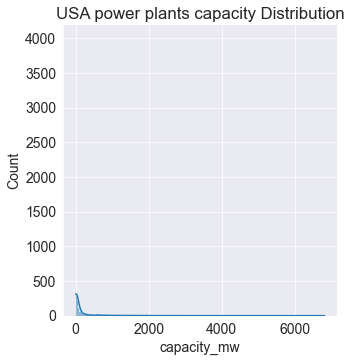

In [19]:
sns.displot(USA_cap_data,x = 'capacity_mw', kde = True)
plt.title('USA power plants capacity Distribution');

In [20]:
#Total capacity
print(f"USA's total power plant capacity is", USA_cap_data['capacity_mw'].sum(), "mw")

USA's total power plant capacity is 1193616.4500000002 mw


In [21]:
#Each plant's capacity as a %
USA_cap_data['cap_perc'] = USA_cap_data['capacity_mw'] / USA_cap_data['capacity_mw'].sum() * 100
USA_cap_data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a,cap_perc
23909,USA,United States of America,Grand Coulee,USA0006163,6809.0,47.9575,-118.9773,Hydro,NaN,NaN,...,18878.623000,19011.492000,20983.990000,NaN,blue,0,0,255,140,0.570451
25534,USA,United States of America,Martin,USA0006043,4317.5,27.0536,-80.5628,Gas,Oil,Solar,...,13013.151079,10884.520919,10885.514925,NaN,black,0,0,0,140,0.361716
29158,USA,United States of America,West County Energy Center,USA0056407,4263.0,26.6986,-80.3747,Gas,Oil,NaN,...,20428.360491,20297.460007,20515.369717,NaN,black,0,0,0,140,0.357150
26603,USA,United States of America,Palo Verde,USA0006008,4209.6,33.3881,-112.8617,Nuclear,NaN,NaN,...,32525.595000,32377.477000,32340.138000,NaN,gray,128,128,128,140,0.352676
28923,USA,United States of America,W A Parish,USA0003470,4008.4,29.4828,-95.6311,Coal,Gas,NaN,...,15808.754800,13299.863200,16206.604600,NaN,black,0,0,0,140,0.335820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25975,USA,United States of America,Murphy Farm Power LLC,USA0057677,1.0,34.9992,-84.1573,Solar,NaN,NaN,...,1.270000,1.358000,1.250000,NaN,green,0,128,0,140,0.000084
25981,USA,United States of America,Murray Hill Solar,USA0057471,1.0,40.6844,-74.4044,Solar,NaN,NaN,...,1.739000,1.787000,1.613000,NaN,green,0,128,0,140,0.000084
26548,USA,United States of America,POTB Digester,USA0058591,1.0,45.4144,-123.8042,Biomass,NaN,NaN,...,7.324520,NaN,0.000000,NaN,green,0,128,0,140,0.000084
21528,USA,United States of America,Bethlehem - West,USA0060478,1.0,42.5390,-73.8243,Solar,NaN,NaN,...,NaN,1.329000,1.548000,0.445928,green,0,128,0,140,0.000084


### Check primary fuel distribution

In [22]:
#Check primary fuel distribution
USA_cap_data['primary_fuel'].value_counts()

Solar           2290
Gas             1741
Hydro           1457
Wind            1043
Oil              847
Waste            567
Coal             338
Biomass          156
Geothermal        65
Nuclear           61
Storage           58
Cogeneration      34
Other             17
Petcoke           12
Name: primary_fuel, dtype: int64

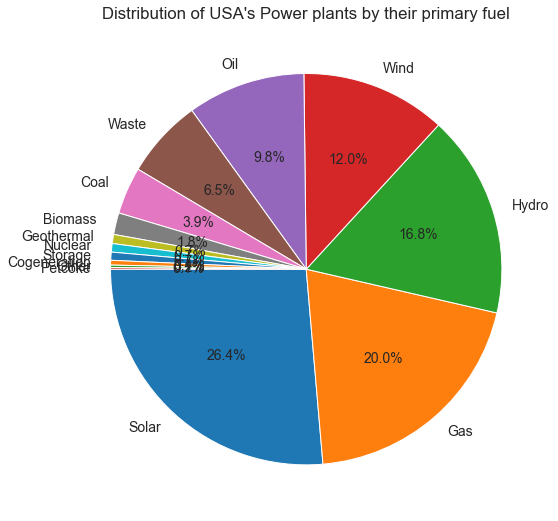

In [23]:
plt.figure(figsize = (16,9))
plt.pie(USA_cap_data['primary_fuel'].value_counts(), 
        labels = USA_cap_data['primary_fuel'].value_counts().index, autopct = '%1.1f%%', startangle= 180)
plt.title("Distribution of USA's Power plants by their primary fuel");

# plt.legend(title = 'Legend', loc = 'best', fontsize = 'small', fancybox = True);

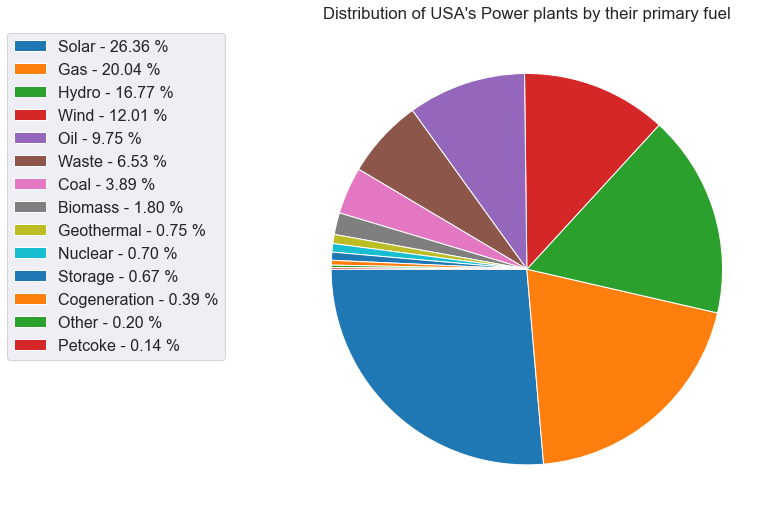

In [24]:
plt.figure(figsize = (16,9))

x = USA_cap_data['primary_fuel'].value_counts().index
y = USA_cap_data['primary_fuel'].value_counts()
percent = 100 * y/y.sum()

patches, texts = plt.pie(y, startangle= 180)
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(x, percent)]
                                                        
sort_legend = True
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, y),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='best', bbox_to_anchor=(-0.1, 1.), fontsize=16)
plt.title("Distribution of USA's Power plants by their primary fuel");

# plt.legend(title = 'Legend', loc = 'best', fontsize = 'small', fancybox = True);

In [25]:
# Explore capacity Distribution
capacity = USA_cap_data[['primary_fuel', 'cap_perc']].groupby('primary_fuel').sum().reset_index()
capacity

,primary_fuel,cap_perc
0,Biomass,0.468978
1,Coal,23.708629
2,Cogeneration,0.083494
3,Gas,44.041610
4,Geothermal,0.315428
5,Hydro,8.481401
6,Nuclear,8.892991
7,Oil,3.137381
8,Other,0.060078
9,Petcoke,0.203926


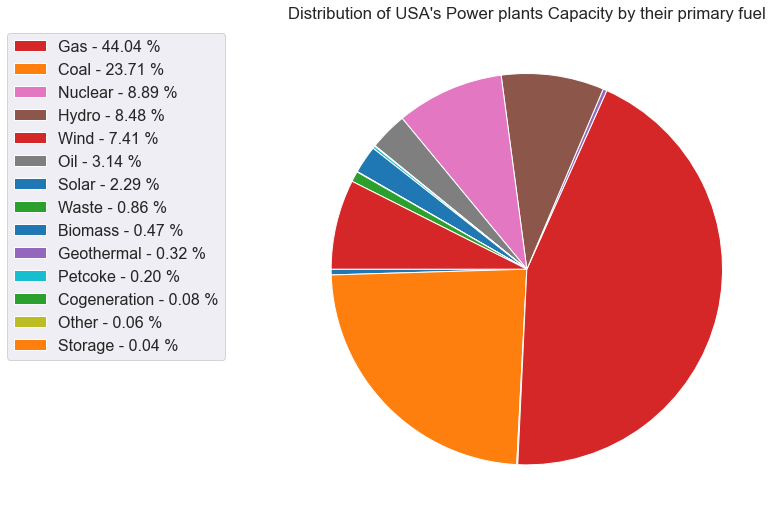

In [26]:
plt.figure(figsize = (16,9))

x = capacity['primary_fuel']
y = capacity['cap_perc']
percent = capacity['cap_perc']

patches, texts = plt.pie(y, startangle= 180)
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(x, percent)]
                                                        
sort_legend = True
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, y),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='best', bbox_to_anchor=(-0.1, 1.), fontsize=16)
plt.title("Distribution of USA's Power plants Capacity by their primary fuel");

# plt.legend(title = 'Legend', loc = 'best', fontsize = 'small', fancybox = True);

Gas powered plants contribute the largest proportion to the power plant capacity in the USA making up 44.04% of the overall. Though solar powered plants are the majority by number, their capacity is at 2.23% of the overall.

## Gas Powered Power plants


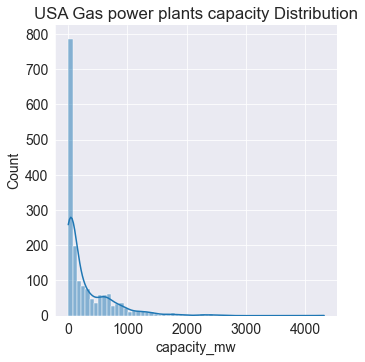

In [27]:
sns.displot(USA_cap_data[USA_cap_data['primary_fuel'] == 'Gas'] , x = 'capacity_mw', kde = True)
plt.title('USA Gas power plants capacity Distribution');

## Explore Generation Data

In [28]:
US_gen_data = USA_cap_data.dropna(subset = ['generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017'])
US_gen_data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a,cap_perc
23909,USA,United States of America,Grand Coulee,USA0006163,6809.0,47.9575,-118.9773,Hydro,NaN,NaN,...,18878.623000,19011.492000,20983.990000,NaN,blue,0,0,255,140,0.570451
25534,USA,United States of America,Martin,USA0006043,4317.5,27.0536,-80.5628,Gas,Oil,Solar,...,13013.151079,10884.520919,10885.514925,NaN,black,0,0,0,140,0.361716
29158,USA,United States of America,West County Energy Center,USA0056407,4263.0,26.6986,-80.3747,Gas,Oil,NaN,...,20428.360491,20297.460007,20515.369717,NaN,black,0,0,0,140,0.357150
26603,USA,United States of America,Palo Verde,USA0006008,4209.6,33.3881,-112.8617,Nuclear,NaN,NaN,...,32525.595000,32377.477000,32340.138000,NaN,gray,128,128,128,140,0.352676
28923,USA,United States of America,W A Parish,USA0003470,4008.4,29.4828,-95.6311,Coal,Gas,NaN,...,15808.754800,13299.863200,16206.604600,NaN,black,0,0,0,140,0.335820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26539,USA,United States of America,PCIP Solar,USA0058305,1.0,36.3125,-78.9675,Solar,NaN,NaN,...,1.682000,1.841000,1.970000,NaN,green,0,128,0,140,0.000084
22703,USA,United States of America,Crown Cooling Facility,USA0058527,1.0,32.9672,-115.5325,Solar,NaN,NaN,...,1.804000,1.325000,1.219000,NaN,green,0,128,0,140,0.000084
25084,USA,United States of America,Langdale,USA0000711,1.0,32.8138,-85.1678,Hydro,NaN,NaN,...,0.000000,0.000000,0.000000,NaN,blue,0,0,255,140,0.000084
25975,USA,United States of America,Murphy Farm Power LLC,USA0057677,1.0,34.9992,-84.1573,Solar,NaN,NaN,...,1.270000,1.358000,1.250000,NaN,green,0,128,0,140,0.000084


In [29]:
## Get a subset - subset for years which we have xco2 values
US_data_gen = US_gen_data[[
    "latitude","longitude", "name", "country_long", "capacity_mw", "geolocation_source", "primary_fuel",
    'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017'
    ]
]
US_data_gen.rename(columns = {'country_long' : 'country'}, inplace = True)
US_data_gen

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\3116139867.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  US_data_gen.rename(columns = {'country_long' : 'country'}, inplace = True)


,latitude,longitude,name,country,capacity_mw,geolocation_source,primary_fuel,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
23909,47.9575,-118.9773,Grand Coulee,United States of America,6809.0,U.S. Energy Information Administration,Hydro,18878.623000,19011.492000,20983.990000
25534,27.0536,-80.5628,Martin,United States of America,4317.5,U.S. Energy Information Administration,Gas,13013.151079,10884.520919,10885.514925
29158,26.6986,-80.3747,West County Energy Center,United States of America,4263.0,U.S. Energy Information Administration,Gas,20428.360491,20297.460007,20515.369717
26603,33.3881,-112.8617,Palo Verde,United States of America,4209.6,U.S. Energy Information Administration,Nuclear,32525.595000,32377.477000,32340.138000
28923,29.4828,-95.6311,W A Parish,United States of America,4008.4,U.S. Energy Information Administration,Coal,15808.754800,13299.863200,16206.604600
...,...,...,...,...,...,...,...,...,...,...
26539,36.3125,-78.9675,PCIP Solar,United States of America,1.0,U.S. Energy Information Administration,Solar,1.682000,1.841000,1.970000
22703,32.9672,-115.5325,Crown Cooling Facility,United States of America,1.0,U.S. Energy Information Administration,Solar,1.804000,1.325000,1.219000
25084,32.8138,-85.1678,Langdale,United States of America,1.0,U.S. Energy Information Administration,Hydro,0.000000,0.000000,0.000000
25975,34.9992,-84.1573,Murphy Farm Power LLC,United States of America,1.0,U.S. Energy Information Administration,Solar,1.270000,1.358000,1.250000


In [30]:
#Check if there are null capacity values
US_data_gen['capacity_mw'].isnull().sum()

0

In [31]:
#Check if there are null gen values
US_data_gen['generation_gwh_2015'].isnull().sum(), US_data_gen['generation_gwh_2016'].isnull().sum(), US_data_gen['generation_gwh_2017'].isnull().sum()

(0, 0, 0)

In [32]:
US_gen_2015 = US_data_gen.drop(labels = ['generation_gwh_2016', 'generation_gwh_2017','country' , 'geolocation_source' ] , axis = 1)
US_gen_2015.rename(columns = {'generation_gwh_2015' : 'generation_gwh'}, inplace = True)
US_gen_2015['latitude_est'] = US_gen_2015['latitude'].mul(2).round().div(2)
US_gen_2015['longitude_est'] = US_gen_2015['longitude'].mul(8).round().div(8)
US_gen_2015

,latitude,longitude,name,capacity_mw,primary_fuel,generation_gwh,latitude_est,longitude_est
23909,47.9575,-118.9773,Grand Coulee,6809.0,Hydro,18878.623000,48.0,-119.000
25534,27.0536,-80.5628,Martin,4317.5,Gas,13013.151079,27.0,-80.625
29158,26.6986,-80.3747,West County Energy Center,4263.0,Gas,20428.360491,26.5,-80.375
26603,33.3881,-112.8617,Palo Verde,4209.6,Nuclear,32525.595000,33.5,-112.875
28923,29.4828,-95.6311,W A Parish,4008.4,Coal,15808.754800,29.5,-95.625
...,...,...,...,...,...,...,...,...
26539,36.3125,-78.9675,PCIP Solar,1.0,Solar,1.682000,36.5,-79.000
22703,32.9672,-115.5325,Crown Cooling Facility,1.0,Solar,1.804000,33.0,-115.500
25084,32.8138,-85.1678,Langdale,1.0,Hydro,0.000000,33.0,-85.125
25975,34.9992,-84.1573,Murphy Farm Power LLC,1.0,Solar,1.270000,35.0,-84.125


### Plot the Spread

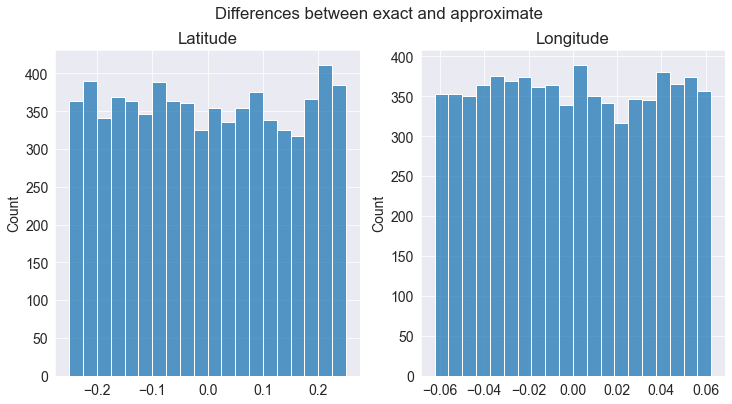

In [33]:
fig, ax = plt.subplots(1,2, figsize = (12,6))
plt.suptitle('Differences between exact and approximate')
g1 = sns.histplot(US_gen_2015['latitude_est'] - US_gen_2015['latitude'], ax = ax[0])
g1.set_title('Latitude')

g2 = sns.histplot(US_gen_2015['longitude_est'] - US_gen_2015['longitude'], ax = ax[1])
g2.set_title('Longitude');

In [34]:
US_gen_2015 = US_data_gen.drop(labels = ['generation_gwh_2016', 'generation_gwh_2017','country' , 'geolocation_source' ] , axis = 1)
US_gen_2015.rename(columns = {'generation_gwh_2015' : 'generation_gwh'}, inplace = True)
US_gen_2015['latitude'] = US_gen_2015['latitude'].mul(2).round().div(2)
US_gen_2015['longitude'] = US_gen_2015['longitude'].mul(8).round().div(8)
US_gen_2015

,latitude,longitude,name,capacity_mw,primary_fuel,generation_gwh
23909,48.0,-119.000,Grand Coulee,6809.0,Hydro,18878.623000
25534,27.0,-80.625,Martin,4317.5,Gas,13013.151079
29158,26.5,-80.375,West County Energy Center,4263.0,Gas,20428.360491
26603,33.5,-112.875,Palo Verde,4209.6,Nuclear,32525.595000
28923,29.5,-95.625,W A Parish,4008.4,Coal,15808.754800
...,...,...,...,...,...,...
26539,36.5,-79.000,PCIP Solar,1.0,Solar,1.682000
22703,33.0,-115.500,Crown Cooling Facility,1.0,Solar,1.804000
25084,33.0,-85.125,Langdale,1.0,Hydro,0.000000
25975,35.0,-84.125,Murphy Farm Power LLC,1.0,Solar,1.270000


In [35]:
US_gen_2016 = US_data_gen.drop(labels = ['generation_gwh_2015', 'generation_gwh_2017','country' , 'geolocation_source' ] , axis = 1)
US_gen_2016.rename(columns = {'generation_gwh_2016' : 'generation_gwh'}, inplace = True)
US_gen_2016['latitude'] = US_gen_2016['latitude'].mul(2).round().div(2)
US_gen_2016['longitude'] = US_gen_2016['longitude'].mul(8).round().div(8)
US_gen_2016

,latitude,longitude,name,capacity_mw,primary_fuel,generation_gwh
23909,48.0,-119.000,Grand Coulee,6809.0,Hydro,19011.492000
25534,27.0,-80.625,Martin,4317.5,Gas,10884.520919
29158,26.5,-80.375,West County Energy Center,4263.0,Gas,20297.460007
26603,33.5,-112.875,Palo Verde,4209.6,Nuclear,32377.477000
28923,29.5,-95.625,W A Parish,4008.4,Coal,13299.863200
...,...,...,...,...,...,...
26539,36.5,-79.000,PCIP Solar,1.0,Solar,1.841000
22703,33.0,-115.500,Crown Cooling Facility,1.0,Solar,1.325000
25084,33.0,-85.125,Langdale,1.0,Hydro,0.000000
25975,35.0,-84.125,Murphy Farm Power LLC,1.0,Solar,1.358000


In [36]:
US_gen_2017 = US_data_gen.drop(labels = ['generation_gwh_2015', 'generation_gwh_2016','country' , 'geolocation_source' ] , axis = 1)
US_gen_2017.rename(columns = {'generation_gwh_2017' : 'generation_gwh'}, inplace = True)
US_gen_2017['latitude'] = US_gen_2017['latitude'].mul(2).round().div(2)
US_gen_2017['longitude'] = US_gen_2017['longitude'].mul(8).round().div(8)
US_gen_2017

,latitude,longitude,name,capacity_mw,primary_fuel,generation_gwh
23909,48.0,-119.000,Grand Coulee,6809.0,Hydro,20983.990000
25534,27.0,-80.625,Martin,4317.5,Gas,10885.514925
29158,26.5,-80.375,West County Energy Center,4263.0,Gas,20515.369717
26603,33.5,-112.875,Palo Verde,4209.6,Nuclear,32340.138000
28923,29.5,-95.625,W A Parish,4008.4,Coal,16206.604600
...,...,...,...,...,...,...
26539,36.5,-79.000,PCIP Solar,1.0,Solar,1.970000
22703,33.0,-115.500,Crown Cooling Facility,1.0,Solar,1.219000
25084,33.0,-85.125,Langdale,1.0,Hydro,0.000000
25975,35.0,-84.125,Murphy Farm Power LLC,1.0,Solar,1.250000


### Spatial Subsetting of USA's co-ordinates
- Latitude(South, North)
- Longitude(West, East)

Subsetting by USA  - [USA]
- Lying entirely in the Northern Hemisphere, the Country extends between 
- 19° and 49.38° latitudes north of the Equator
- and 66.95° 156° longitudes west of the GMT (-156° and -66.95°)

In [37]:
# USA's xco2 Measurements
lat = Xco2_L3_df[Xco2_L3_df['latitude'] >= 19.0][Xco2_L3_df['latitude'] <= 50]
USA_xco2 = lat[lat['longitude'] >= -156][lat['longitude'] <= -67]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\504145097.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lat = Xco2_L3_df[Xco2_L3_df['latitude'] >= 19.0][Xco2_L3_df['latitude'] <= 50]
C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\504145097.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  USA_xco2 = lat[lat['longitude'] >= -156][lat['longitude'] <= -67]


In [38]:
USA_xco2

,longitude,latitude,xco2,Year,Month
14297,-155.625,19.0,398.892333,2015,January
14298,-155.625,19.5,398.751562,2015,January
14299,-155.625,20.0,398.865189,2015,January
14300,-155.625,20.5,399.007949,2015,January
14301,-155.625,21.0,399.015716,2015,January
...,...,...,...,...,...
17739816,-67.500,48.0,418.954181,2022,February
17739817,-67.500,48.5,418.965386,2022,February
17739818,-67.500,49.0,419.208773,2022,February
17739819,-67.500,49.5,419.011699,2022,February


In [39]:
#Annualize USA's XCo2 Measurements
annual_USA_xco2 = USA_xco2[['xco2','longitude' , 'latitude', 'Year']].groupby(
    ['Year', 'longitude', 'latitude']).mean().reset_index()

annual_USA_xco2

,Year,longitude,latitude,xco2
0,2015,-155.625,19.0,400.165298
1,2015,-155.625,19.5,400.052777
2,2015,-155.625,20.0,400.144198
3,2015,-155.625,20.5,400.251596
4,2015,-155.625,21.0,400.266135
...,...,...,...,...
71563,2022,-67.500,48.0,418.954181
71564,2022,-67.500,48.5,418.965386
71565,2022,-67.500,49.0,419.208773
71566,2022,-67.500,49.5,419.011699


xco2 Longitudes are to the nearest 125th's while Latitudes are to the nearest 0.5

In [40]:
annual_USA_xco2.to_csv('annual_USA_xco2.csv', index = None)

### USA's average xco2 Emissions

In [41]:
#Check for XCo2 Measurements
USA_xco2_avg = USA_xco2[['xco2', 'Year']].groupby(['Year']).mean().reset_index()
USA_xco2_avg['Gt_Co2'] = USA_xco2_avg['xco2'] * 7.81
USA_xco2_avg

,Year,xco2,Gt_Co2
0,2015,400.031993,3124.249863
1,2016,403.387709,3150.458004
2,2017,405.682857,3168.383111
3,2018,407.870485,3185.468485
4,2019,410.463145,3205.717161
5,2020,412.986938,3225.427987
6,2021,415.497944,3245.038941
7,2022,417.628195,3261.676207


### Average emissions over global

USA is a huge emitter of xco2. Her xco2 levels are higher than the global average

In [42]:
USA_xco2_avg['xco2>global'] = USA_xco2_avg['xco2']-global_xco2_avg['xco2']
USA_xco2_avg['Gt_co2>global'] = USA_xco2_avg['Gt_Co2']-global_xco2_avg['Gt_Co2']
USA_xco2_avg

,Year,xco2,Gt_Co2,xco2>global,Gt_co2>global
0,2015,400.031993,3124.249863,1.564594,12.219476
1,2016,403.387709,3150.458004,1.770971,13.831281
2,2017,405.682857,3168.383111,1.784269,13.935141
3,2018,407.870485,3185.468485,1.682213,13.138080
4,2019,410.463145,3205.717161,1.734371,13.545434
5,2020,412.986938,3225.427987,1.731463,13.522722
6,2021,415.497944,3245.038941,1.902198,14.856163
7,2022,417.628195,3261.676207,1.878196,14.668714


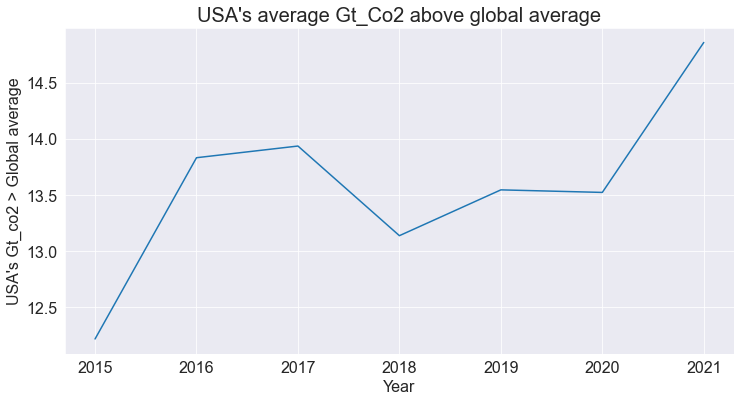

In [43]:
plt.figure(figsize = (12, 6))
sns.lineplot(data = USA_xco2_avg[USA_xco2_avg['Year'] < 2022], x = 'Year', y = 'Gt_co2>global')
plt.title("USA's average Gt_Co2 above global average", fontsize = 20)
plt.xlabel('Year', fontsize =16)
plt.ylabel("USA's Gt_co2 > Global average", fontsize = 16)
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16);

### 2015

In [44]:
USA_xco2_2015 = annual_USA_xco2[annual_USA_xco2['Year'] == 2015]
USA_xco2_2015.drop(labels = 'Year', axis = 1, inplace = True)
USA_xco2_2015

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\1077031689.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_xco2_2015.drop(labels = 'Year', axis = 1, inplace = True)


,longitude,latitude,xco2
0,-155.625,19.0,400.165298
1,-155.625,19.5,400.052777
2,-155.625,20.0,400.144198
3,-155.625,20.5,400.251596
4,-155.625,21.0,400.266135
...,...,...,...
8941,-67.500,48.0,399.631247
8942,-67.500,48.5,399.617122
8943,-67.500,49.0,399.708553
8944,-67.500,49.5,399.626790


In [45]:
US_gen_2015_xco2 = US_gen_2015.merge(USA_xco2_2015, how = 'left', on = ['latitude', 'longitude'])
US_gen_2015_xco2

,latitude,longitude,name,capacity_mw,primary_fuel,generation_gwh,xco2
0,48.0,-119.000,Grand Coulee,6809.0,Hydro,18878.623000,NaN
1,27.0,-80.625,Martin,4317.5,Gas,13013.151079,400.409806
2,26.5,-80.375,West County Energy Center,4263.0,Gas,20428.360491,NaN
3,33.5,-112.875,Palo Verde,4209.6,Nuclear,32525.595000,NaN
4,29.5,-95.625,W A Parish,4008.4,Coal,15808.754800,400.520340
...,...,...,...,...,...,...,...
7168,36.5,-79.000,PCIP Solar,1.0,Solar,1.682000,NaN
7169,33.0,-115.500,Crown Cooling Facility,1.0,Solar,1.804000,NaN
7170,33.0,-85.125,Langdale,1.0,Hydro,0.000000,NaN
7171,35.0,-84.125,Murphy Farm Power LLC,1.0,Solar,1.270000,NaN


In [46]:
#Drop Missing xco2 values
US_2015_xco2 = US_gen_2015_xco2.dropna(subset = 'xco2')
len(US_2015_xco2)

1454

In [47]:
US_2015_xco2

,latitude,longitude,name,capacity_mw,primary_fuel,generation_gwh,xco2
1,27.0,-80.625,Martin,4317.5,Gas,13013.151079,400.409806
4,29.5,-95.625,W A Parish,4008.4,Coal,15808.754800,400.520340
5,33.0,-83.750,Scherer,3564.0,Coal,16989.296506,400.476274
11,38.5,-81.875,John E Amos,2932.6,Coal,14072.153653,400.393446
15,40.0,-76.250,Peach Bottom,2784.6,Nuclear,19858.302000,400.271833
...,...,...,...,...,...,...,...
7124,41.0,-75.000,WC Landfill Energy LLC,1.0,Solar,6.630000,400.103049
7128,39.5,-86.250,Indy Grocers,1.0,Solar,0.719000,400.146553
7135,33.0,-84.375,Upson Rocky Creek Solar Plant,1.0,Solar,1.373000,400.379557
7153,34.0,-118.750,Las Virgenes Municipal Water District,1.0,Solar,2.067120,400.567161


### 2016

In [48]:
USA_xco2_2016 = annual_USA_xco2[annual_USA_xco2['Year'] == 2016]
USA_xco2_2016.drop(labels = 'Year', axis = 1, inplace = True)
USA_xco2_2016

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\607223052.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_xco2_2016.drop(labels = 'Year', axis = 1, inplace = True)


,longitude,latitude,xco2
8946,-155.625,19.0,403.601676
8947,-155.625,19.5,403.496838
8948,-155.625,20.0,403.589964
8949,-155.625,20.5,403.691652
8950,-155.625,21.0,403.715283
...,...,...,...
17887,-67.500,48.0,402.660076
17888,-67.500,48.5,402.645693
17889,-67.500,49.0,402.734982
17890,-67.500,49.5,402.659418


In [49]:
US_gen_2016_xco2 = US_gen_2016.merge(USA_xco2_2016, how = 'left', on = ['latitude', 'longitude'])
US_2016_xco2 = US_gen_2016_xco2.dropna(subset = 'xco2')
len(US_2016_xco2)

1454

In [50]:
US_2016_xco2

,latitude,longitude,name,capacity_mw,primary_fuel,generation_gwh,xco2
1,27.0,-80.625,Martin,4317.5,Gas,10884.520919,403.725988
4,29.5,-95.625,W A Parish,4008.4,Coal,13299.863200,403.924152
5,33.0,-83.750,Scherer,3564.0,Coal,16240.255482,403.872112
11,38.5,-81.875,John E Amos,2932.6,Coal,14311.262279,403.859094
15,40.0,-76.250,Peach Bottom,2784.6,Nuclear,21875.435000,403.636837
...,...,...,...,...,...,...,...
7124,41.0,-75.000,WC Landfill Energy LLC,1.0,Solar,0.000000,403.417627
7128,39.5,-86.250,Indy Grocers,1.0,Solar,3.013000,403.576891
7135,33.0,-84.375,Upson Rocky Creek Solar Plant,1.0,Solar,1.452000,403.763122
7153,34.0,-118.750,Las Virgenes Municipal Water District,1.0,Solar,2.068000,403.835388


### 2017

In [51]:
USA_xco2_2017 = annual_USA_xco2[annual_USA_xco2['Year'] == 2017]
USA_xco2_2017.drop(labels = 'Year', axis = 1, inplace = True)
USA_xco2_2017

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\621302968.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_xco2_2017.drop(labels = 'Year', axis = 1, inplace = True)


,longitude,latitude,xco2
17892,-155.625,19.0,405.762460
17893,-155.625,19.5,405.654693
17894,-155.625,20.0,405.752143
17895,-155.625,20.5,405.863984
17896,-155.625,21.0,405.882820
...,...,...,...
26833,-67.500,48.0,405.133932
26834,-67.500,48.5,405.128246
26835,-67.500,49.0,405.226580
26836,-67.500,49.5,405.164897


In [52]:
US_gen_2017_xco2 = US_gen_2017.merge(USA_xco2_2017, how = 'left', on = ['latitude', 'longitude'])
US_2017_xco2 = US_gen_2017_xco2.dropna(subset = 'xco2')
len(US_2017_xco2)

1454

### Concatenate the databases

In [53]:
US_xco2 = pd.concat([US_2015_xco2, US_2016_xco2, US_2017_xco2], axis = 0, sort = False)
US_xco2

,latitude,longitude,name,capacity_mw,primary_fuel,generation_gwh,xco2
1,27.0,-80.625,Martin,4317.5,Gas,13013.151079,400.409806
4,29.5,-95.625,W A Parish,4008.4,Coal,15808.754800,400.520340
5,33.0,-83.750,Scherer,3564.0,Coal,16989.296506,400.476274
11,38.5,-81.875,John E Amos,2932.6,Coal,14072.153653,400.393446
15,40.0,-76.250,Peach Bottom,2784.6,Nuclear,19858.302000,400.271833
...,...,...,...,...,...,...,...
7124,41.0,-75.000,WC Landfill Energy LLC,1.0,Solar,1.502000,405.654238
7128,39.5,-86.250,Indy Grocers,1.0,Solar,1.513000,405.544538
7135,33.0,-84.375,Upson Rocky Creek Solar Plant,1.0,Solar,1.334000,405.922715
7153,34.0,-118.750,Las Virgenes Municipal Water District,1.0,Solar,2.010000,406.246909


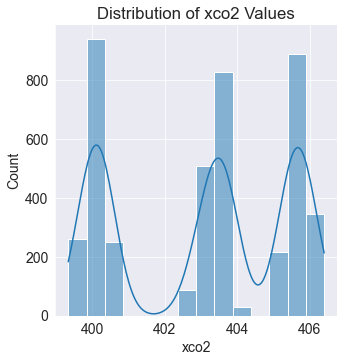

In [54]:
sns.displot(US_xco2['xco2'], kde = True)
plt.title('Distribution of xco2 Values');

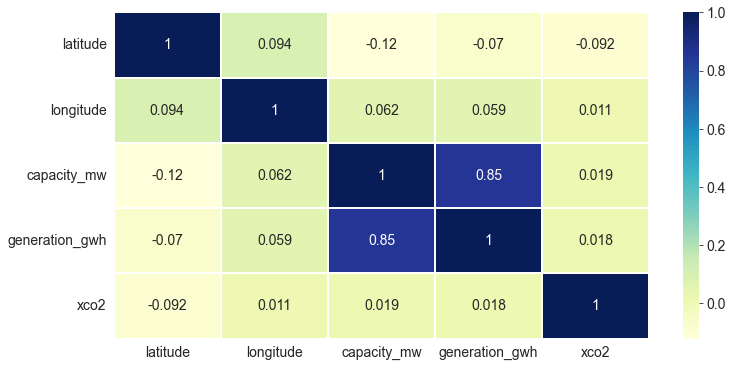

In [55]:
fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(US_xco2.corr(), ax=ax, cmap ="YlGnBu", linewidths = 0.1, annot = True)
plt.show()

## B. World Cities Database

[World Cities Database](https://simplemaps.com/data/world-cities) is proud to offer a simple, accurate and up-to-date database of the world's cities and towns under a creative commons license. Commercial use is allowed and is built from the ground up using authoritative sources such as the NGIA, US Geological Survey, US Census Bureau, and NASA.
   
The database is:

- Up-to-date: It was last refreshed in March 2022.
- Comprehensive: Over 4 million unique cities and towns from every country in the world.
- Accurate: Cleaned and aggregated from official sources. 
- Includes latitude and longitude coordinates.
- Simple: A single CSV file, concise field names, only one entry per city.

In [56]:
world_cities_df = pd.read_csv('https://raw.githubusercontent.com/Mitchell-Odili/Measuring-Carbon/main/csv_files/L3/worldcities.csv')
world_cities_df

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id
0,Tokyo,Tokyo,35.6839,139.7744,Japan,JP,JPN,Tōkyō,primary,39105000.0,1392685764
1,Jakarta,Jakarta,-6.2146,106.8451,Indonesia,ID,IDN,Jakarta,primary,35362000.0,1360771077
2,Delhi,Delhi,28.6667,77.2167,India,IN,IND,Delhi,admin,31870000.0,1356872604
3,Manila,Manila,14.6000,120.9833,Philippines,PH,PHL,Manila,primary,23971000.0,1608618140
4,São Paulo,Sao Paulo,-23.5504,-46.6339,Brazil,BR,BRA,São Paulo,admin,22495000.0,1076532519
...,...,...,...,...,...,...,...,...,...,...,...
42900,Tukchi,Tukchi,57.3670,139.5000,Russia,RU,RUS,Khabarovskiy Kray,NaN,10.0,1643472801
42901,Numto,Numto,63.6667,71.3333,Russia,RU,RUS,Khanty-Mansiyskiy Avtonomnyy Okrug-Yugra,NaN,10.0,1643985006
42902,Nord,Nord,81.7166,-17.8000,Greenland,GL,GRL,Sermersooq,NaN,10.0,1304217709
42903,Timmiarmiut,Timmiarmiut,62.5333,-42.2167,Greenland,GL,GRL,Kujalleq,NaN,10.0,1304206491


In [57]:
USA_cities = world_cities_df[world_cities_df['country'] == 'United States']
USA_cities

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id
12,New York,New York,40.6943,-73.9249,United States,US,USA,New York,NaN,18713220.0,1840034016
27,Los Angeles,Los Angeles,34.1139,-118.4068,United States,US,USA,California,NaN,12750807.0,1840020491
51,Chicago,Chicago,41.8373,-87.6862,United States,US,USA,Illinois,NaN,8604203.0,1840000494
91,Miami,Miami,25.7839,-80.2102,United States,US,USA,Florida,NaN,6445545.0,1840015149
108,Dallas,Dallas,32.7936,-96.7662,United States,US,USA,Texas,NaN,5743938.0,1840019440
...,...,...,...,...,...,...,...,...,...,...,...
42008,Ridgeland,Ridgeland,32.4680,-80.9176,United States,US,USA,South Carolina,NaN,5005.0,1840018086
42009,Dwight,Dwight,41.0987,-88.4240,United States,US,USA,Illinois,NaN,5005.0,1840011783
42010,Oak Park Heights,Oak Park Heights,45.0324,-92.8099,United States,US,USA,Minnesota,NaN,5003.0,1840007812
42011,Gillespie,Gillespie,39.1258,-89.8173,United States,US,USA,Illinois,NaN,5002.0,1840008489


In [58]:
USA_cities.drop(labels = ['city_ascii', 'country', 'iso2' , 'iso3', 'capital', 'id'], axis = 1, inplace = True)
USA_cities

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\3561487513.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_cities.drop(labels = ['city_ascii', 'country', 'iso2' , 'iso3', 'capital', 'id'], axis = 1, inplace = True)


,city,lat,lng,admin_name,population
12,New York,40.6943,-73.9249,New York,18713220.0
27,Los Angeles,34.1139,-118.4068,California,12750807.0
51,Chicago,41.8373,-87.6862,Illinois,8604203.0
91,Miami,25.7839,-80.2102,Florida,6445545.0
108,Dallas,32.7936,-96.7662,Texas,5743938.0
...,...,...,...,...,...
42008,Ridgeland,32.4680,-80.9176,South Carolina,5005.0
42009,Dwight,41.0987,-88.4240,Illinois,5005.0
42010,Oak Park Heights,45.0324,-92.8099,Minnesota,5003.0
42011,Gillespie,39.1258,-89.8173,Illinois,5002.0


In [59]:
USA_cities = USA_cities.rename(columns = {'lat' : 'latitude', 'lng' : 'longitude'})
USA_cities

,city,latitude,longitude,admin_name,population
12,New York,40.6943,-73.9249,New York,18713220.0
27,Los Angeles,34.1139,-118.4068,California,12750807.0
51,Chicago,41.8373,-87.6862,Illinois,8604203.0
91,Miami,25.7839,-80.2102,Florida,6445545.0
108,Dallas,32.7936,-96.7662,Texas,5743938.0
...,...,...,...,...,...
42008,Ridgeland,32.4680,-80.9176,South Carolina,5005.0
42009,Dwight,41.0987,-88.4240,Illinois,5005.0
42010,Oak Park Heights,45.0324,-92.8099,Minnesota,5003.0
42011,Gillespie,39.1258,-89.8173,Illinois,5002.0


In [60]:
USA_cities_est = USA_cities.copy(deep = True)
USA_cities_est['latitude_est'] = USA_cities_est['latitude'].mul(2).round().div(2)
USA_cities_est['longitude_est'] = USA_cities_est['longitude'].mul(4).round().div(4)
USA_cities_est

,city,latitude,longitude,admin_name,population,latitude_est,longitude_est
12,New York,40.6943,-73.9249,New York,18713220.0,40.5,-74.00
27,Los Angeles,34.1139,-118.4068,California,12750807.0,34.0,-118.50
51,Chicago,41.8373,-87.6862,Illinois,8604203.0,42.0,-87.75
91,Miami,25.7839,-80.2102,Florida,6445545.0,26.0,-80.25
108,Dallas,32.7936,-96.7662,Texas,5743938.0,33.0,-96.75
...,...,...,...,...,...,...,...
42008,Ridgeland,32.4680,-80.9176,South Carolina,5005.0,32.5,-81.00
42009,Dwight,41.0987,-88.4240,Illinois,5005.0,41.0,-88.50
42010,Oak Park Heights,45.0324,-92.8099,Minnesota,5003.0,45.0,-92.75
42011,Gillespie,39.1258,-89.8173,Illinois,5002.0,39.0,-89.75


In [61]:
USA_cities_est.city.nunique()

6068

In [62]:
USA_cap_data['powerplant_capacity'] = USA_cap_data['capacity_mw'] * 1e6
USA_cap_data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a,cap_perc,powerplant_capacity
23909,USA,United States of America,Grand Coulee,USA0006163,6809.0,47.9575,-118.9773,Hydro,NaN,NaN,...,19011.492000,20983.990000,NaN,blue,0,0,255,140,0.570451,6.809000e+09
25534,USA,United States of America,Martin,USA0006043,4317.5,27.0536,-80.5628,Gas,Oil,Solar,...,10884.520919,10885.514925,NaN,black,0,0,0,140,0.361716,4.317500e+09
29158,USA,United States of America,West County Energy Center,USA0056407,4263.0,26.6986,-80.3747,Gas,Oil,NaN,...,20297.460007,20515.369717,NaN,black,0,0,0,140,0.357150,4.263000e+09
26603,USA,United States of America,Palo Verde,USA0006008,4209.6,33.3881,-112.8617,Nuclear,NaN,NaN,...,32377.477000,32340.138000,NaN,gray,128,128,128,140,0.352676,4.209600e+09
28923,USA,United States of America,W A Parish,USA0003470,4008.4,29.4828,-95.6311,Coal,Gas,NaN,...,13299.863200,16206.604600,NaN,black,0,0,0,140,0.335820,4.008400e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25975,USA,United States of America,Murphy Farm Power LLC,USA0057677,1.0,34.9992,-84.1573,Solar,NaN,NaN,...,1.358000,1.250000,NaN,green,0,128,0,140,0.000084,1.000000e+06
25981,USA,United States of America,Murray Hill Solar,USA0057471,1.0,40.6844,-74.4044,Solar,NaN,NaN,...,1.787000,1.613000,NaN,green,0,128,0,140,0.000084,1.000000e+06
26548,USA,United States of America,POTB Digester,USA0058591,1.0,45.4144,-123.8042,Biomass,NaN,NaN,...,NaN,0.000000,NaN,green,0,128,0,140,0.000084,1.000000e+06
21528,USA,United States of America,Bethlehem - West,USA0060478,1.0,42.5390,-73.8243,Solar,NaN,NaN,...,1.329000,1.548000,0.445928,green,0,128,0,140,0.000084,1.000000e+06


In [63]:
USA_cap = USA_cap_data[['name', 'powerplant_capacity', 'latitude', 'longitude', 'primary_fuel']]
USA_cap_est = USA_cap.copy(deep = True)
USA_cap_est['latitude_est'] = USA_cap_est['latitude'].mul(2).round().div(2)
USA_cap_est['longitude_est'] = USA_cap_est['longitude'].mul(4).round().div(4)
USA_cap_est

,name,powerplant_capacity,latitude,longitude,primary_fuel,latitude_est,longitude_est
23909,Grand Coulee,6.809000e+09,47.9575,-118.9773,Hydro,48.0,-119.00
25534,Martin,4.317500e+09,27.0536,-80.5628,Gas,27.0,-80.50
29158,West County Energy Center,4.263000e+09,26.6986,-80.3747,Gas,26.5,-80.25
26603,Palo Verde,4.209600e+09,33.3881,-112.8617,Nuclear,33.5,-112.75
28923,W A Parish,4.008400e+09,29.4828,-95.6311,Coal,29.5,-95.75
...,...,...,...,...,...,...,...
25975,Murphy Farm Power LLC,1.000000e+06,34.9992,-84.1573,Solar,35.0,-84.25
25981,Murray Hill Solar,1.000000e+06,40.6844,-74.4044,Solar,40.5,-74.50
26548,POTB Digester,1.000000e+06,45.4144,-123.8042,Biomass,45.5,-123.75
21528,Bethlehem - West,1.000000e+06,42.5390,-73.8243,Solar,42.5,-73.75


In [64]:
USA_cap_pop = USA_cities_est.merge(USA_cap_est, how = 'left', on = ['latitude_est', 'longitude_est'])
USA_cap_pop.drop(labels = ['latitude_x', 'longitude_x', 'latitude_y', 'longitude_y'], axis = 1, inplace = True)
USA_cap_pop.rename(columns = {'latitude_est' : 'latitude', 'longitude_est' : 'longitude'}, inplace = True)
USA_cap_pop

,city,admin_name,population,latitude,longitude,name,powerplant_capacity,primary_fuel
0,New York,New York,18713220.0,40.5,-74.00,East River,7.162000e+08,Gas
1,New York,New York,18713220.0,40.5,-74.00,Gowanus Gas Turbines Generating,6.400000e+08,Oil
2,New York,New York,18713220.0,40.5,-74.00,PSEG Kearny Generating Station,6.050000e+08,Gas
3,New York,New York,18713220.0,40.5,-74.00,Bayonne Energy Center,5.120000e+08,Gas
4,New York,New York,18713220.0,40.5,-74.00,Narrows Gas Turbines Generating,3.520000e+08,Gas
...,...,...,...,...,...,...,...,...
52636,Oak Park Heights,Minnesota,5003.0,45.0,-92.75,Hastings Solar,4.500000e+06,Solar
52637,Oak Park Heights,Minnesota,5003.0,45.0,-92.75,Hastings City Hydroelectric,4.400000e+06,Hydro
52638,Oak Park Heights,Minnesota,5003.0,45.0,-92.75,Apple River,2.400000e+06,Hydro
52639,Gillespie,Illinois,5002.0,39.0,-89.75,NaN,NaN,NaN


In [65]:
USA_cap_pop.powerplant_capacity.value_counts().sum()

51509

In [66]:
USA_cap_pop.city.nunique()

6068

### Cement Plants

#### Global Database of Cement Production Assets

The [Global Database of Cement Production Assets](https://www.cgfi.ac.uk/spatial-finance-initiative/geoasset-project/geoasset-databases/) provides information on global cement production plants that are operational today. The database contains 3,117 cement plants with exact geolocation and provides information about ownership, production type, plant type, capacity and production start year where available.

Cement is an essential material used in construction all around the world, but cement production processes are highly emissions intensive, accounting for more than 5% of anthropogenic CO2 emissions[1]. The process consists of three steps: the mixing of limestone with other materials; the heating of the limestone mixture to produce clinker and the grinding of clinker with different ingredients to produce cement. The grinding process can happen in integrated facilities where the clinker is also produced or in independent grinding facilities closer to its end market. While the bulk of greenhouse gas emissions associated with cement production stem from clinker production and integrated facilities, the database covers both integrated as well as independent grinding facilities.

The Global Database of Cement Production Assets can be used by others and is available under a CC BY 4.0 license. The suggested citation is: “McCarten, M., Bayaraa, M., Caldecott, B., Christiaen, C., Foster, P., Hickey, C., Kampmann, D., Layman, C., Rossi, C., Scott, K., Tang, K., Tkachenko, N., and Yoken, D. 2021. Global Database of Cement Production Assets. Spatial Finance Initiative”

[1] Andrew, R. M. (2018). Global CO 2 emissions from cement production. Earth System Science Data, 10(1), 195-217.

In [67]:
Global_cement_plants = pd.ExcelFile('https://github.com/Mitchell-Odili/Measuring-Carbon/blob/main/xslx_files/SFI-Global-Cement-Database-July-2021.xlsx?raw=true')

In [68]:
Global_cement_plants.sheet_names

['About', 'SFI_ALD_Cement_Database']

In [69]:
About = pd.read_excel('https://github.com/Mitchell-Odili/Measuring-Carbon/blob/main/xslx_files/SFI-Global-Cement-Database-July-2021.xlsx?raw=true', sheet_name = 'About')
About

,Spatial Finance Initiative Global Cement Database (July 2021),Unnamed: 1,Unnamed: 2
0,NaN,NaN,NaN
1,This work is licensed under the Creative Commo...,NaN,NaN
2,NaN,NaN,NaN
3,This database has been created as part of the ...,NaN,NaN
4,NaN,NaN,NaN
5,"Suggested citation: McCarten, M, Bayaraa, M, C...",NaN,NaN
6,NaN,NaN,NaN
7,Please contact matthew.mccarten@smithschool.ox...,NaN,NaN
8,NaN,NaN,NaN
9,File Layout and Field Descriptions,NaN,NaN


In [70]:
About.loc[About['Unnamed: 1'] == 'capacity']

,Spatial Finance Initiative Global Cement Database (July 2021),Unnamed: 1,Unnamed: 2
25,15,capacity,Total cement production capacity (millions of ...


In [71]:
Global_cem_plants = pd.read_excel('https://github.com/Mitchell-Odili/Measuring-Carbon/blob/main/xslx_files/SFI-Global-Cement-Database-July-2021.xlsx?raw=true', sheet_name = 'SFI_ALD_Cement_Database')
Global_cem_plants

,uid,city,state,country,iso3,country_code,region,sub_region,latitude,longitude,...,parent_holding_status,parent_ticker,parent_exchange,parent_permid_2,parent_name_2,ownership_stake_2,parent_lei_2,parent_holding_status_2,parent_ticker_2,parent_exchange_2
0,GACTAFG0001,Pol-e Khomri,Baghlan,Afghanistan,AFG,4.0,Asia,Southern Asia,35.965800,68.686338,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,GACTAFG0002,Injil,Herat,Afghanistan,AFG,4.0,Asia,Southern Asia,34.322144,61.953503,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,GACTAGO0001,Luanda,Luanda,Angola,AGO,24.0,Africa,Sub-Saharan Africa,-8.766173,13.316051,...,Private,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,GACTAGO0002,Cacuaco,Luanda,Angola,AGO,24.0,Africa,Sub-Saharan Africa,-8.796392,13.426780,...,Private,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,GACTAGO0003,Lobito,Benguela,Angola,AGO,24.0,Africa,Sub-Saharan Africa,-12.342644,13.581766,...,Private,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3112,GACTZWE0002,Bulawayo,Bulawayo Province,Zimbabwe,ZWE,716.0,Africa,Sub-Saharan Africa,-20.114474,28.685907,...,Public,PPC,JNB,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3113,GACTZWE0003,Colleen Bawn,Matabeleland South Province,Zimbabwe,ZWE,716.0,Africa,Sub-Saharan Africa,-21.007200,29.212761,...,Public,PPC,JNB,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3114,GACTZWE0004,Harare,Harare Province,Zimbabwe,ZWE,716.0,Africa,Sub-Saharan Africa,-17.859217,31.156976,...,Public,PPC,JNB,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3115,GACTZWE0005,Shurugwi,Midlands Province,Zimbabwe,ZWE,716.0,Africa,Sub-Saharan Africa,-19.417322,30.050341,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
US_cem_plants = Global_cem_plants[Global_cem_plants['country'] == 'United States of America']
US_cem_plants

,uid,city,state,country,iso3,country_code,region,sub_region,latitude,longitude,...,parent_holding_status,parent_ticker,parent_exchange,parent_permid_2,parent_name_2,ownership_stake_2,parent_lei_2,parent_holding_status_2,parent_ticker_2,parent_exchange_2
2880,GACTUSA0001,San Antonio,Texas,United States of America,USA,840.0,Americas,Northern America,29.611942,-98.374994,...,Public,BZU,MIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2881,GACTUSA0002,Cape Girardeau,Missouri,United States of America,USA,840.0,Americas,Northern America,37.267699,-89.537885,...,Public,BZU,MIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2882,GACTUSA0003,Chattanooga,Tennessee,United States of America,USA,840.0,Americas,Northern America,35.101255,-85.343670,...,Public,BZU,MIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2883,GACTUSA0004,Festus,Missouri,United States of America,USA,840.0,Americas,Northern America,38.181745,-90.337427,...,Public,BZU,MIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2884,GACTUSA0005,Greencastle,Indiana,United States of America,USA,840.0,Americas,Northern America,39.616962,-86.867685,...,Public,BZU,MIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2980,GACTUSA0101,Ragland,Alabama,United States of America,USA,840.0,Americas,Northern America,33.733579,-86.154991,...,Public,VCT,PAR,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2981,GACTUSA0102,Charlevoix,Michigan,United States of America,USA,840.0,Americas,Northern America,45.317821,-85.299328,...,Private,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2982,GACTUSA0103,Dixon,Illinois,United States of America,USA,840.0,Americas,Northern America,41.860725,-89.455077,...,Private,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2983,GACTUSA0104,Detroit,Michigan,United States of America,USA,840.0,Americas,Northern America,42.286723,-83.135752,...,Private,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [73]:
US_cem_plants.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105 entries, 2880 to 2984
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uid                      105 non-null    object 
 1   city                     105 non-null    object 
 2   state                    105 non-null    object 
 3   country                  105 non-null    object 
 4   iso3                     105 non-null    object 
 5   country_code             105 non-null    float64
 6   region                   105 non-null    object 
 7   sub_region               105 non-null    object 
 8   latitude                 105 non-null    float64
 9   longitude                105 non-null    float64
 10  accuracy                 105 non-null    object 
 11  status                   105 non-null    object 
 12  plant_type               99 non-null     object 
 13  production_type          82 non-null     object 
 14  capacity              

In [74]:
US_cem_plants = US_cem_plants[['city', 'state', 'latitude', 'longitude', 'status', 'capacity']]
US_cem_plants

,city,state,latitude,longitude,status,capacity
2880,San Antonio,Texas,29.611942,-98.374994,Operating,NaN
2881,Cape Girardeau,Missouri,37.267699,-89.537885,Operating,NaN
2882,Chattanooga,Tennessee,35.101255,-85.343670,Operating,0.69
2883,Festus,Missouri,38.181745,-90.337427,Operating,1.59
2884,Greencastle,Indiana,39.616962,-86.867685,Operating,NaN
...,...,...,...,...,...,...
2980,Ragland,Alabama,33.733579,-86.154991,Operating,1.13
2981,Charlevoix,Michigan,45.317821,-85.299328,Operating,1.53
2982,Dixon,Illinois,41.860725,-89.455077,Operating,1.13
2983,Detroit,Michigan,42.286723,-83.135752,Operating,NaN


In [75]:
US_cem_plants.dropna(subset = 'capacity', inplace = True)
US_cem_plants

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\665945513.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  US_cem_plants.dropna(subset = 'capacity', inplace = True)


,city,state,latitude,longitude,status,capacity
2882,Chattanooga,Tennessee,35.101255,-85.343670,Operating,0.690
2883,Festus,Missouri,38.181745,-90.337427,Operating,1.590
2887,Stockertown,Pennsylvania,40.750707,-75.271596,Operating,1.050
2888,Sumterville,Florida,28.760848,-82.025558,Operating,1.200
2889,Chanute,Kansas,37.698646,-95.460495,Operating,0.840
2892,Foreman,Arkansas,33.694814,-94.420652,Operating,0.860
2893,Louisville,Nebraska,41.006191,-96.154160,Operating,1.030
2902,Perry,Georgia,32.415567,-83.633103,Operating,0.800
2903,Demopolis,Alabama,32.513940,-87.814993,Operating,0.900
2907,Canyon Lake,Texas,29.673765,-98.184297,Operating,2.420


In [76]:
# Convert capacity to tons
US_cem_plants['cement_capacity'] = US_cem_plants['capacity'] * 1e6
US_cem_plants

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\1921241185.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  US_cem_plants['cement_capacity'] = US_cem_plants['capacity'] * 1e6


,city,state,latitude,longitude,status,capacity,cement_capacity
2882,Chattanooga,Tennessee,35.101255,-85.343670,Operating,0.690,690000.0
2883,Festus,Missouri,38.181745,-90.337427,Operating,1.590,1590000.0
2887,Stockertown,Pennsylvania,40.750707,-75.271596,Operating,1.050,1050000.0
2888,Sumterville,Florida,28.760848,-82.025558,Operating,1.200,1200000.0
2889,Chanute,Kansas,37.698646,-95.460495,Operating,0.840,840000.0
2892,Foreman,Arkansas,33.694814,-94.420652,Operating,0.860,860000.0
2893,Louisville,Nebraska,41.006191,-96.154160,Operating,1.030,1030000.0
2902,Perry,Georgia,32.415567,-83.633103,Operating,0.800,800000.0
2903,Demopolis,Alabama,32.513940,-87.814993,Operating,0.900,900000.0
2907,Canyon Lake,Texas,29.673765,-98.184297,Operating,2.420,2420000.0


In [77]:
US_cem_plants_est = US_cem_plants.copy(deep = True)
US_cem_plants_est['latitude_est'] = US_cem_plants_est['latitude'].mul(2).round().div(2)
US_cem_plants_est['longitude_est'] = US_cem_plants_est['longitude'].mul(8).round().div(8)
US_cem_plants_est.drop(labels = ['latitude', 'longitude', 'city', 'state', 'status', 'capacity'], axis = 1, inplace = True)
US_cem_plants_est.rename(columns = {'latitude_est' : 'latitude', 'longitude_est' : 'longitude' }, inplace = True)
US_cem_plants_est

,cement_capacity,latitude,longitude
2882,690000.0,35.0,-85.375
2883,1590000.0,38.0,-90.375
2887,1050000.0,41.0,-75.250
2888,1200000.0,29.0,-82.000
2889,840000.0,37.5,-95.500
2892,860000.0,33.5,-94.375
2893,1030000.0,41.0,-96.125
2902,800000.0,32.5,-83.625
2903,900000.0,32.5,-87.875
2907,2420000.0,29.5,-98.125


In [78]:
US_cem_plants_est.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47 entries, 2882 to 2982
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   cement_capacity  47 non-null     float64
 1   latitude         47 non-null     float64
 2   longitude        47 non-null     float64
dtypes: float64(3)
memory usage: 1.5 KB


In [79]:
US_cem_cap_pop = USA_cap_pop.merge(US_cem_plants_est, how = 'left', on = ['latitude', 'longitude'])
US_cem_cap_pop

,city,admin_name,population,latitude,longitude,name,powerplant_capacity,primary_fuel,cement_capacity
0,New York,New York,18713220.0,40.5,-74.00,East River,7.162000e+08,Gas,NaN
1,New York,New York,18713220.0,40.5,-74.00,Gowanus Gas Turbines Generating,6.400000e+08,Oil,NaN
2,New York,New York,18713220.0,40.5,-74.00,PSEG Kearny Generating Station,6.050000e+08,Gas,NaN
3,New York,New York,18713220.0,40.5,-74.00,Bayonne Energy Center,5.120000e+08,Gas,NaN
4,New York,New York,18713220.0,40.5,-74.00,Narrows Gas Turbines Generating,3.520000e+08,Gas,NaN
...,...,...,...,...,...,...,...,...,...
52650,Oak Park Heights,Minnesota,5003.0,45.0,-92.75,Hastings Solar,4.500000e+06,Solar,NaN
52651,Oak Park Heights,Minnesota,5003.0,45.0,-92.75,Hastings City Hydroelectric,4.400000e+06,Hydro,NaN
52652,Oak Park Heights,Minnesota,5003.0,45.0,-92.75,Apple River,2.400000e+06,Hydro,NaN
52653,Gillespie,Illinois,5002.0,39.0,-89.75,NaN,NaN,NaN,NaN


In [80]:
US_cem_cap_pop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52655 entries, 0 to 52654
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   city                 52655 non-null  object 
 1   admin_name           52655 non-null  object 
 2   population           52655 non-null  float64
 3   latitude             52655 non-null  float64
 4   longitude            52655 non-null  float64
 5   name                 51523 non-null  object 
 6   powerplant_capacity  51523 non-null  float64
 7   primary_fuel         51523 non-null  object 
 8   cement_capacity      121 non-null    float64
dtypes: float64(5), object(4)
memory usage: 4.0+ MB


In [81]:
US_cem_cap_pop.city.nunique()

6068

### Xco2

In [82]:
USA_xco2_2021 = annual_USA_xco2[annual_USA_xco2['Year'] == 2021]
USA_xco2_2021.drop(labels = 'Year', axis = 1, inplace = True)
USA_xco2_2021

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\375531723.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_xco2_2021.drop(labels = 'Year', axis = 1, inplace = True)


,longitude,latitude,xco2
53676,-155.625,19.0,415.606935
53677,-155.625,19.5,415.511961
53678,-155.625,20.0,415.593618
53679,-155.625,20.5,415.683238
53680,-155.625,21.0,415.700461
...,...,...,...
62617,-67.500,48.0,415.039675
62618,-67.500,48.5,415.043622
62619,-67.500,49.0,415.139040
62620,-67.500,49.5,415.078915


In [83]:
USA_cap_pop = US_cem_cap_pop.merge(USA_xco2_2021, how = 'left', on = ['latitude', 'longitude'])
USA_cap_pop

,city,admin_name,population,latitude,longitude,name,powerplant_capacity,primary_fuel,cement_capacity,xco2
0,New York,New York,18713220.0,40.5,-74.00,East River,7.162000e+08,Gas,NaN,NaN
1,New York,New York,18713220.0,40.5,-74.00,Gowanus Gas Turbines Generating,6.400000e+08,Oil,NaN,NaN
2,New York,New York,18713220.0,40.5,-74.00,PSEG Kearny Generating Station,6.050000e+08,Gas,NaN,NaN
3,New York,New York,18713220.0,40.5,-74.00,Bayonne Energy Center,5.120000e+08,Gas,NaN,NaN
4,New York,New York,18713220.0,40.5,-74.00,Narrows Gas Turbines Generating,3.520000e+08,Gas,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
52650,Oak Park Heights,Minnesota,5003.0,45.0,-92.75,Hastings Solar,4.500000e+06,Solar,NaN,NaN
52651,Oak Park Heights,Minnesota,5003.0,45.0,-92.75,Hastings City Hydroelectric,4.400000e+06,Hydro,NaN,NaN
52652,Oak Park Heights,Minnesota,5003.0,45.0,-92.75,Apple River,2.400000e+06,Hydro,NaN,NaN
52653,Gillespie,Illinois,5002.0,39.0,-89.75,NaN,NaN,NaN,NaN,NaN


In [84]:
USA_cap_pop['xco2'].value_counts().sum()

9208

In [85]:
USA_prep = USA_cap_pop.sort_values(by = ['latitude', 'longitude']).reset_index()
USA_prep.drop('index', axis = 1, inplace = True)
USA_prep

,city,admin_name,population,latitude,longitude,name,powerplant_capacity,primary_fuel,cement_capacity,xco2
0,Hawaiian Ocean View,Hawaii,5011.0,19.0,-155.75,Pakini Nui Wind Farm,21000000.0,Wind,NaN,NaN
1,Kalaoa,Hawaii,11729.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN
2,Holualoa,Hawaii,9688.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN
3,Kahaluu-Keauhou,Hawaii,5291.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN
4,Hilo,Hawaii,45056.0,19.5,-155.00,Puna Geothermal Venture I,51000000.0,Geothermal,NaN,415.605289
...,...,...,...,...,...,...,...,...,...,...
52650,Farmers Loop,Alaska,5214.0,65.0,-147.75,Aurora Energy LLC Chena,27500000.0,Coal,NaN,NaN
52651,Farmers Loop,Alaska,5214.0,65.0,-147.75,University of Alaska Fairbanks,22600000.0,Coal,NaN,NaN
52652,Farmers Loop,Alaska,5214.0,65.0,-147.75,Utility Plants Section,20000000.0,Coal,NaN,NaN
52653,Badger,Alaska,18911.0,65.0,-147.50,NaN,NaN,NaN,NaN,NaN


In [86]:
# check 2021 xco2 levels in lat 19.0 long -155.75
annual_USA_xco2[annual_USA_xco2['latitude'] == 19.0][annual_USA_xco2['longitude'] == -155.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\704006363.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_USA_xco2[annual_USA_xco2['latitude'] == 19.0][annual_USA_xco2['longitude'] == -155.625]


,Year,longitude,latitude,xco2
0,2015,-155.625,19.0,400.165298
8946,2016,-155.625,19.0,403.601676
17892,2017,-155.625,19.0,405.762460
26838,2018,-155.625,19.0,407.981575
35784,2019,-155.625,19.0,410.692749
44730,2020,-155.625,19.0,413.188359
53676,2021,-155.625,19.0,415.606935
62622,2022,-155.625,19.0,416.890019


In [87]:
# USA_prep.loc[-1] = ['Hawaiian Ocean View', 'Hawaii', 5011.0, 19.0, -155.75, 'Pakini Nui Wind Farm', 21.0, 'Wind', 415.606935]
# USA_prep.index = USA_prep.index + 1
# USA_prep = USA_prep.sort_index()
# USA_prep

### Global Steel Plant Tracker by Global Energy Monitor, March 2022

The [Global Steel Plant Tracker](https://globalenergymonitor.org/projects/global-steel-plant-tracker/) (GSPT) provides information on global crude iron and steel production plants, and includes every plant currently operating with a capacity of five hundred thousand tonnes per year (ttpa) or more of crude iron or steel.


In [88]:
#Read in the Excel workbook
Global_Steel_plants = pd.ExcelFile('https://github.com/Mitchell-Odili/Measuring-Carbon/blob/main/xslx_files/Global-Steel-Plant-Tracker-March-2022.xlsx?raw=true')

In [89]:
#Check the Excel Files
Global_Steel_plants.sheet_names

['About', 'Steel Plants', 'Yearly Production', 'Metadata']

In [90]:
# Define a function to return dataframes/files

# Excel File path
path = 'https://github.com/Mitchell-Odili/Measuring-Carbon/blob/main/xslx_files/Global-Steel-Plant-Tracker-March-2022.xlsx?raw=true'

def extract_df(sheet_name):
  if sheet_name in Global_Steel_plants.sheet_names:
    dataframe = pd.read_excel(path, sheet_name = sheet_name)
  else:
    print ('Sheet name not found')

  return dataframe

In [91]:
About = extract_df('About')
About

,Unnamed: 0,Global Steel Plant Tracker - March 2022,Unnamed: 2
0,NaN,NaN,NaN
1,NaN,Copyright © 2022 by Global Energy Monitor. Dis...,NaN
2,NaN,"Contact: Caitlin Swalec, Global Steel Plant Tr...",NaN
3,NaN,"Citation: ""Global Steel Plant Tracker,"" Global...",NaN
4,NaN,Notes,NaN
5,NaN,"1. For background, additional infomation, and ...",NaN
6,NaN,"2. For the Methodology, see https://globalener...",NaN
7,NaN,"3. For summary statistics by province, country...",NaN
8,NaN,"4. For links to reports using GSPT data, see ""...",NaN
9,NaN,5. This database only includes iron and steelm...,NaN


In [92]:
Metadata = extract_df('Metadata')
Metadata

,"""Steel Plants"" data",Unnamed: 1
0,Column Name,Description
1,Plant ID,One unique GEM identifier is assigned to each ...
2,Plant name (English),Common plant name for steel plant in English l...
3,Plant name (other language),Common plant name for steel plant in other lan...
4,Other plant names (English),Other plant names for steel plant in English l...
...,...,...
57,EAF steel production (ttpa),Plant production for steel produced by EAF rou...
58,OHF steel production (ttpa),Plant production for steel produced by OHF rou...
59,Iron production (ttpa),Plant production across all ironmaking process...
60,BF production (ttpa),Plant production for iron produced by BF route...


In [93]:
Metadata.loc[Metadata['"Steel Plants" data'] == 'Coordinates']

,"""Steel Plants"" data",Unnamed: 1
18,Coordinates,Coordinates of steel plant.


In [94]:
Steel_plants = extract_df('Steel Plants')
Steel_plants.head(2)

,Plant ID,Plant name (English),Plant name (other language),Other plant names (English),Other plant names (other language),SOE status,SOE state department,Parent,Parent PermID,Owner,...,Workforce size,ISO14001,ISO50001,ResponsibleSteel Certification,Main production process,Main production equipment,Detailed production equipment,Power source,Iron ore source,Met coal source
0,SDZ00001,Algerian Qatari Steel Jijel plant,الجزائرية القطرية للصلب (Arabic),AQS,NaN,full,Qatar Steel,Qatar Steel Company QPSC [49%]; Groupe Industr...,5000010731 [49%]; 5000941519 [46%]; GEM0000000...,Algerian Qatari Steel,...,1500,NaN,NaN,NaT,integrated (DRI),"DRI, EAF","1 Midrex DRI plant (2.5 MTPA, began in 2019); ...",NaN,NaN,NaN
1,SAO00001,Aceria Angola Bengo steel plant,NaN,ADA Steel,NaN,NaN,NaN,Aceria Angola [100%],GEM0000001 [100%],Aceria Angola,...,600,unknown,unknown,NaT,electric,EAF,EAF (# unknown),NaN,NaN,NaN


In [95]:
Steel_plants.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1201 entries, 0 to 1200
Data columns (total 49 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Plant ID                             1201 non-null   object        
 1   Plant name (English)                 1201 non-null   object        
 2   Plant name (other language)          721 non-null    object        
 3   Other plant names (English)          694 non-null    object        
 4   Other plant names (other language)   272 non-null    object        
 5   SOE status                           231 non-null    object        
 6   SOE state department                 226 non-null    object        
 7   Parent                               1201 non-null   object        
 8   Parent PermID                        1201 non-null   object        
 9   Owner                                1201 non-null   object        
 10  Owner PermID

In [96]:
Steel_plants['Coordinates']

0          36.753961, 6.244420
1         -8.582400, 13.405271
2          36.795924, 7.707633
3          36.795924, 7.707633
4         35.770912, -0.263031
                 ...          
1196     35.978104, -83.956572
1197    33.285828, -111.586561
1198    33.285828, -111.586561
1199    39.815712, -101.275181
1200     35.936472, -89.910381
Name: Coordinates, Length: 1201, dtype: object

In [97]:
Steel_annual_prod = extract_df('Yearly Production')
Steel_annual_prod.head(5)

,Unnamed: 0,Unnamed: 1,2019,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,2020,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15
0,Plant ID,Plant name (English),Crude steel production (ttpa),BOF steel production (ttpa),EAF steel production (ttpa),OHF steel production (ttpa),Iron production (ttpa),BF production (ttpa),DRI production (ttpa),Crude steel production (ttpa),BOF steel production (ttpa),EAF steel production (ttpa),OHF steel production (ttpa),Iron production (ttpa),BF production (ttpa),DRI production (ttpa)
1,SAE00001,GHC Emirates Steel Industries Abu Dhabi plant,unknown,NaN,unknown,NaN,unknown,NaN,unknown,unknown,NaN,unknown,NaN,unknown,NaN,unknown
2,SAL00001,Kurum International Elbasan steel plant,unknown,NaN,unknown,NaN,unknown,unknown,NaN,unknown,NaN,unknown,NaN,unknown,unknown,NaN
3,SAO00001,Aceria Angola Bengo steel plant,unknown,NaN,unknown,NaN,NaN,NaN,NaN,unknown,NaN,unknown,NaN,NaN,NaN,NaN
4,SAR00001,ArcelorMittal Acindar Villa Constitución steel...,1100,NaN,1100,NaN,unknown,NaN,unknown,800,NaN,800,NaN,>0,NaN,>0


In [98]:
USA_steel_plants = Steel_plants[Steel_plants['Country'] == 'United States']
USA_steel_plants.head(2)

,Plant ID,Plant name (English),Plant name (other language),Other plant names (English),Other plant names (other language),SOE status,SOE state department,Parent,Parent PermID,Owner,...,Workforce size,ISO14001,ISO50001,ResponsibleSteel Certification,Main production process,Main production equipment,Detailed production equipment,Power source,Iron ore source,Met coal source
777,SUS00081,AM/NS Calvert LLC,NaN,NaN,NaN,NaN,NaN,ArcelorMittal SA [50%]; Nippon Steel Corp [50%],5000030092 [50%]; 4295877313 [50%],AM/NS Calvert LLC,...,1604,yes,NaN,NaT,electric,EAF,EAF,NaN,NaN,NaN
1118,SUS00003,Cleveland-Cliffs Dearborn steel plant,NaN,"Dearborn Works, AK Steel Dearborn",NaN,NaN,NaN,Cleveland-Cliffs Inc [100%],4295903753 [100%],Cleveland-Cliffs Inc,...,1325,NaN,NaN,NaT,integrated (BF),"BF, BOF",1 BF (1797m3); 2 BOF (began in 1963),NaN,NaN,NaN


In [99]:
USA_steel_plants = USA_steel_plants[['Plant name (English)', 'Coordinates', 'Status', 'Nominal crude steel capacity (ttpa)',
                                        'Nominal iron capacity (ttpa)']]

In [100]:
USA_steel_plants

,Plant name (English),Coordinates,Status,Nominal crude steel capacity (ttpa),Nominal iron capacity (ttpa)
777,AM/NS Calvert LLC,"31.148446, -87.990521",proposed,1500.0,NaN
1118,Cleveland-Cliffs Dearborn steel plant,"42.308171, -83.161353",operating,3000.0,1929
1119,Cleveland-Cliffs Middletown steel plant,"39.488589, -84.386197",operating,3000.0,2090
1120,Cleveland-Cliffs Riverdale steel plant,"41.657321, -87.625702",operating,1000.0,NaN
1121,Cleveland-Cliffs Burns Harbor steel plant,"41.631221, -87.143846",operating,5000.0,4044
...,...,...,...,...,...
1196,CMC Tennessee steel plant,"35.978104, -83.956572",operating,544.0,NaN
1197,CMC Arizona steel plant,"33.285828, -111.586561",operating,354.0,NaN
1198,CMC Arizona steel plant EAF expansion,"33.285828, -111.586561",proposed,500.0,NaN
1199,BlueScope Steel EAF plant,"39.815712, -101.275181",proposed,500.0,NaN


In [101]:
USA_steel_plants = USA_steel_plants[USA_steel_plants['Status'] == 'operating']
USA_steel_plants

,Plant name (English),Coordinates,Status,Nominal crude steel capacity (ttpa),Nominal iron capacity (ttpa)
1118,Cleveland-Cliffs Dearborn steel plant,"42.308171, -83.161353",operating,3000.00000,1929
1119,Cleveland-Cliffs Middletown steel plant,"39.488589, -84.386197",operating,3000.00000,2090
1120,Cleveland-Cliffs Riverdale steel plant,"41.657321, -87.625702",operating,1000.00000,NaN
1121,Cleveland-Cliffs Burns Harbor steel plant,"41.631221, -87.143846",operating,5000.00000,4044
1122,Cleveland-Cliffs Steelton steel plant,"40.230720, -76.838506",operating,1000.00000,NaN
...,...,...,...,...,...
1193,Alton Steel plant,"38.884465, -90.14579",operating,680.38875,NaN
1194,CMC Alabama steel plant,"33.534372, -86.75773",operating,653.00000,NaN
1195,CMC South Carolina steel plant,"33.962272, -81.052011",operating,776.00000,NaN
1196,CMC Tennessee steel plant,"35.978104, -83.956572",operating,544.00000,NaN


In [102]:
len(USA_steel_plants)

70

In [103]:
USA_steel_plants.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 70 entries, 1118 to 1197
Data columns (total 5 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Plant name (English)                 70 non-null     object 
 1   Coordinates                          70 non-null     object 
 2   Status                               70 non-null     object 
 3   Nominal crude steel capacity (ttpa)  67 non-null     float64
 4   Nominal iron capacity (ttpa)         11 non-null     object 
dtypes: float64(1), object(4)
memory usage: 3.3+ KB


In [104]:
#Split coordinates 
USA_steel_plants[['latitude', 'longitude']] = USA_steel_plants['Coordinates'].str.split(' ', 1, expand=True)
USA_steel_plants

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\477762253.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_steel_plants[['latitude', 'longitude']] = USA_steel_plants['Coordinates'].str.split(' ', 1, expand=True)
C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\477762253.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_steel_plants[['latitude', 'longitude']] = USA_steel_plants['Coordinates'].str.split(' ', 1, expand=True)


,Plant name (English),Coordinates,Status,Nominal crude steel capacity (ttpa),Nominal iron capacity (ttpa),latitude,longitude
1118,Cleveland-Cliffs Dearborn steel plant,"42.308171, -83.161353",operating,3000.00000,1929,"42.308171,",-83.161353
1119,Cleveland-Cliffs Middletown steel plant,"39.488589, -84.386197",operating,3000.00000,2090,"39.488589,",-84.386197
1120,Cleveland-Cliffs Riverdale steel plant,"41.657321, -87.625702",operating,1000.00000,NaN,"41.657321,",-87.625702
1121,Cleveland-Cliffs Burns Harbor steel plant,"41.631221, -87.143846",operating,5000.00000,4044,"41.631221,",-87.143846
1122,Cleveland-Cliffs Steelton steel plant,"40.230720, -76.838506",operating,1000.00000,NaN,"40.230720,",-76.838506
...,...,...,...,...,...,...,...
1193,Alton Steel plant,"38.884465, -90.14579",operating,680.38875,NaN,"38.884465,",-90.14579
1194,CMC Alabama steel plant,"33.534372, -86.75773",operating,653.00000,NaN,"33.534372,",-86.75773
1195,CMC South Carolina steel plant,"33.962272, -81.052011",operating,776.00000,NaN,"33.962272,",-81.052011
1196,CMC Tennessee steel plant,"35.978104, -83.956572",operating,544.00000,NaN,"35.978104,",-83.956572


In [105]:
# remove commas from latitude
USA_steel_plants['latitude'] = USA_steel_plants['latitude'].replace(',','', regex=True)
USA_steel_plants

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\3752753554.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_steel_plants['latitude'] = USA_steel_plants['latitude'].replace(',','', regex=True)


,Plant name (English),Coordinates,Status,Nominal crude steel capacity (ttpa),Nominal iron capacity (ttpa),latitude,longitude
1118,Cleveland-Cliffs Dearborn steel plant,"42.308171, -83.161353",operating,3000.00000,1929,42.308171,-83.161353
1119,Cleveland-Cliffs Middletown steel plant,"39.488589, -84.386197",operating,3000.00000,2090,39.488589,-84.386197
1120,Cleveland-Cliffs Riverdale steel plant,"41.657321, -87.625702",operating,1000.00000,NaN,41.657321,-87.625702
1121,Cleveland-Cliffs Burns Harbor steel plant,"41.631221, -87.143846",operating,5000.00000,4044,41.631221,-87.143846
1122,Cleveland-Cliffs Steelton steel plant,"40.230720, -76.838506",operating,1000.00000,NaN,40.230720,-76.838506
...,...,...,...,...,...,...,...
1193,Alton Steel plant,"38.884465, -90.14579",operating,680.38875,NaN,38.884465,-90.14579
1194,CMC Alabama steel plant,"33.534372, -86.75773",operating,653.00000,NaN,33.534372,-86.75773
1195,CMC South Carolina steel plant,"33.962272, -81.052011",operating,776.00000,NaN,33.962272,-81.052011
1196,CMC Tennessee steel plant,"35.978104, -83.956572",operating,544.00000,NaN,35.978104,-83.956572


In [106]:
USA_steel_plants.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 70 entries, 1118 to 1197
Data columns (total 7 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Plant name (English)                 70 non-null     object 
 1   Coordinates                          70 non-null     object 
 2   Status                               70 non-null     object 
 3   Nominal crude steel capacity (ttpa)  67 non-null     float64
 4   Nominal iron capacity (ttpa)         11 non-null     object 
 5   latitude                             70 non-null     object 
 6   longitude                            70 non-null     object 
dtypes: float64(1), object(6)
memory usage: 4.4+ KB


In [107]:
USA_steel_plants.drop(labels = ['Coordinates', 'Status'], axis = 1, inplace = True)
USA_steel_plants

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\3593016555.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_steel_plants.drop(labels = ['Coordinates', 'Status'], axis = 1, inplace = True)


,Plant name (English),Nominal crude steel capacity (ttpa),Nominal iron capacity (ttpa),latitude,longitude
1118,Cleveland-Cliffs Dearborn steel plant,3000.00000,1929,42.308171,-83.161353
1119,Cleveland-Cliffs Middletown steel plant,3000.00000,2090,39.488589,-84.386197
1120,Cleveland-Cliffs Riverdale steel plant,1000.00000,NaN,41.657321,-87.625702
1121,Cleveland-Cliffs Burns Harbor steel plant,5000.00000,4044,41.631221,-87.143846
1122,Cleveland-Cliffs Steelton steel plant,1000.00000,NaN,40.230720,-76.838506
...,...,...,...,...,...
1193,Alton Steel plant,680.38875,NaN,38.884465,-90.14579
1194,CMC Alabama steel plant,653.00000,NaN,33.534372,-86.75773
1195,CMC South Carolina steel plant,776.00000,NaN,33.962272,-81.052011
1196,CMC Tennessee steel plant,544.00000,NaN,35.978104,-83.956572


In [108]:
#Convert lat long to numeric
USA_steel_plants['latitude'] = USA_steel_plants['latitude'].apply(pd.to_numeric, errors='coerce')
USA_steel_plants['longitude'] = USA_steel_plants['longitude'].apply(pd.to_numeric, errors='coerce')
USA_steel_plants

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\2202936479.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_steel_plants['latitude'] = USA_steel_plants['latitude'].apply(pd.to_numeric, errors='coerce')
C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\2202936479.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_steel_plants['longitude'] = USA_steel_plants['longitude'].apply(pd.to_numeric, errors='coerce')


,Plant name (English),Nominal crude steel capacity (ttpa),Nominal iron capacity (ttpa),latitude,longitude
1118,Cleveland-Cliffs Dearborn steel plant,3000.00000,1929,42.308171,-83.161353
1119,Cleveland-Cliffs Middletown steel plant,3000.00000,2090,39.488589,-84.386197
1120,Cleveland-Cliffs Riverdale steel plant,1000.00000,NaN,41.657321,-87.625702
1121,Cleveland-Cliffs Burns Harbor steel plant,5000.00000,4044,41.631221,-87.143846
1122,Cleveland-Cliffs Steelton steel plant,1000.00000,NaN,40.230720,-76.838506
...,...,...,...,...,...
1193,Alton Steel plant,680.38875,NaN,38.884465,-90.145790
1194,CMC Alabama steel plant,653.00000,NaN,33.534372,-86.757730
1195,CMC South Carolina steel plant,776.00000,NaN,33.962272,-81.052011
1196,CMC Tennessee steel plant,544.00000,NaN,35.978104,-83.956572


In [109]:
# Convert > 0 in Nominal iron capacity (ttpa) to 0
USA_steel_plants['Nominal iron capacity (ttpa)'] = USA_steel_plants['Nominal iron capacity (ttpa)'].replace('>0',0, regex=True)
USA_steel_plants

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\2573030010.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_steel_plants['Nominal iron capacity (ttpa)'] = USA_steel_plants['Nominal iron capacity (ttpa)'].replace('>0',0, regex=True)


,Plant name (English),Nominal crude steel capacity (ttpa),Nominal iron capacity (ttpa),latitude,longitude
1118,Cleveland-Cliffs Dearborn steel plant,3000.00000,1929.0,42.308171,-83.161353
1119,Cleveland-Cliffs Middletown steel plant,3000.00000,2090.0,39.488589,-84.386197
1120,Cleveland-Cliffs Riverdale steel plant,1000.00000,NaN,41.657321,-87.625702
1121,Cleveland-Cliffs Burns Harbor steel plant,5000.00000,4044.0,41.631221,-87.143846
1122,Cleveland-Cliffs Steelton steel plant,1000.00000,NaN,40.230720,-76.838506
...,...,...,...,...,...
1193,Alton Steel plant,680.38875,NaN,38.884465,-90.145790
1194,CMC Alabama steel plant,653.00000,NaN,33.534372,-86.757730
1195,CMC South Carolina steel plant,776.00000,NaN,33.962272,-81.052011
1196,CMC Tennessee steel plant,544.00000,NaN,35.978104,-83.956572


In [110]:
# Convert Nominal iron capacity (ttpa) to numeric
USA_steel_plants['Nominal iron capacity (ttpa)'] = USA_steel_plants['Nominal iron capacity (ttpa)'].apply(pd.to_numeric, errors='coerce')
USA_steel_plants

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\2324301008.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_steel_plants['Nominal iron capacity (ttpa)'] = USA_steel_plants['Nominal iron capacity (ttpa)'].apply(pd.to_numeric, errors='coerce')


,Plant name (English),Nominal crude steel capacity (ttpa),Nominal iron capacity (ttpa),latitude,longitude
1118,Cleveland-Cliffs Dearborn steel plant,3000.00000,1929.0,42.308171,-83.161353
1119,Cleveland-Cliffs Middletown steel plant,3000.00000,2090.0,39.488589,-84.386197
1120,Cleveland-Cliffs Riverdale steel plant,1000.00000,NaN,41.657321,-87.625702
1121,Cleveland-Cliffs Burns Harbor steel plant,5000.00000,4044.0,41.631221,-87.143846
1122,Cleveland-Cliffs Steelton steel plant,1000.00000,NaN,40.230720,-76.838506
...,...,...,...,...,...
1193,Alton Steel plant,680.38875,NaN,38.884465,-90.145790
1194,CMC Alabama steel plant,653.00000,NaN,33.534372,-86.757730
1195,CMC South Carolina steel plant,776.00000,NaN,33.962272,-81.052011
1196,CMC Tennessee steel plant,544.00000,NaN,35.978104,-83.956572


In [111]:
USA_steel_plants.fillna(0, inplace = True)

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\253290388.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_steel_plants.fillna(0, inplace = True)


In [112]:
USA_steel_plants

,Plant name (English),Nominal crude steel capacity (ttpa),Nominal iron capacity (ttpa),latitude,longitude
1118,Cleveland-Cliffs Dearborn steel plant,3000.00000,1929.0,42.308171,-83.161353
1119,Cleveland-Cliffs Middletown steel plant,3000.00000,2090.0,39.488589,-84.386197
1120,Cleveland-Cliffs Riverdale steel plant,1000.00000,0.0,41.657321,-87.625702
1121,Cleveland-Cliffs Burns Harbor steel plant,5000.00000,4044.0,41.631221,-87.143846
1122,Cleveland-Cliffs Steelton steel plant,1000.00000,0.0,40.230720,-76.838506
...,...,...,...,...,...
1193,Alton Steel plant,680.38875,0.0,38.884465,-90.145790
1194,CMC Alabama steel plant,653.00000,0.0,33.534372,-86.757730
1195,CMC South Carolina steel plant,776.00000,0.0,33.962272,-81.052011
1196,CMC Tennessee steel plant,544.00000,0.0,35.978104,-83.956572


In [113]:
USA_steel_plants_est = USA_steel_plants.copy(deep = True)
USA_steel_plants_est['latitude_est'] = USA_steel_plants_est['latitude'].mul(2).round().div(2)
USA_steel_plants_est['longitude_est'] = USA_steel_plants_est['longitude'].mul(4).round().div(4)
USA_steel_plants_est

,Plant name (English),Nominal crude steel capacity (ttpa),Nominal iron capacity (ttpa),latitude,longitude,latitude_est,longitude_est
1118,Cleveland-Cliffs Dearborn steel plant,3000.00000,1929.0,42.308171,-83.161353,42.5,-83.25
1119,Cleveland-Cliffs Middletown steel plant,3000.00000,2090.0,39.488589,-84.386197,39.5,-84.50
1120,Cleveland-Cliffs Riverdale steel plant,1000.00000,0.0,41.657321,-87.625702,41.5,-87.75
1121,Cleveland-Cliffs Burns Harbor steel plant,5000.00000,4044.0,41.631221,-87.143846,41.5,-87.25
1122,Cleveland-Cliffs Steelton steel plant,1000.00000,0.0,40.230720,-76.838506,40.0,-76.75
...,...,...,...,...,...,...,...
1193,Alton Steel plant,680.38875,0.0,38.884465,-90.145790,39.0,-90.25
1194,CMC Alabama steel plant,653.00000,0.0,33.534372,-86.757730,33.5,-86.75
1195,CMC South Carolina steel plant,776.00000,0.0,33.962272,-81.052011,34.0,-81.00
1196,CMC Tennessee steel plant,544.00000,0.0,35.978104,-83.956572,36.0,-84.00


In [114]:
USA_steel_plants_est.drop(labels = ['latitude', 'longitude'], axis = 1, inplace = True)
USA_steel_plants_est.rename(columns = {'latitude_est' : 'latitude', 'longitude_est' : 'longitude', 'Nominal crude steel capacity (ttpa)' : 'Crude_steel_capacity_ttpa', 'Nominal iron capacity (ttpa)' : 'iron_capacity_ttpa'}, inplace = True)
USA_steel_plants_est

,Plant name (English),Crude_steel_capacity_ttpa,iron_capacity_ttpa,latitude,longitude
1118,Cleveland-Cliffs Dearborn steel plant,3000.00000,1929.0,42.5,-83.25
1119,Cleveland-Cliffs Middletown steel plant,3000.00000,2090.0,39.5,-84.50
1120,Cleveland-Cliffs Riverdale steel plant,1000.00000,0.0,41.5,-87.75
1121,Cleveland-Cliffs Burns Harbor steel plant,5000.00000,4044.0,41.5,-87.25
1122,Cleveland-Cliffs Steelton steel plant,1000.00000,0.0,40.0,-76.75
...,...,...,...,...,...
1193,Alton Steel plant,680.38875,0.0,39.0,-90.25
1194,CMC Alabama steel plant,653.00000,0.0,33.5,-86.75
1195,CMC South Carolina steel plant,776.00000,0.0,34.0,-81.00
1196,CMC Tennessee steel plant,544.00000,0.0,36.0,-84.00


In [115]:
USA_steel_plants_est['Crude_steel_capacity_ttpa'] = USA_steel_plants_est['Crude_steel_capacity_ttpa'] * 1e3
USA_steel_plants_est['iron_capacity_ttpa'] = USA_steel_plants_est['iron_capacity_ttpa'] * 1e3
USA_steel_plants_est.rename(columns = {'Crude_steel_capacity_ttpa' : 'Crude_steel_capacity_tpa', 'iron_capacity_ttpa' : 'iron_capacity_tpa'}, inplace = True)
USA_steel_plants_est

,Plant name (English),Crude_steel_capacity_tpa,iron_capacity_tpa,latitude,longitude
1118,Cleveland-Cliffs Dearborn steel plant,3000000.00,1929000.0,42.5,-83.25
1119,Cleveland-Cliffs Middletown steel plant,3000000.00,2090000.0,39.5,-84.50
1120,Cleveland-Cliffs Riverdale steel plant,1000000.00,0.0,41.5,-87.75
1121,Cleveland-Cliffs Burns Harbor steel plant,5000000.00,4044000.0,41.5,-87.25
1122,Cleveland-Cliffs Steelton steel plant,1000000.00,0.0,40.0,-76.75
...,...,...,...,...,...
1193,Alton Steel plant,680388.75,0.0,39.0,-90.25
1194,CMC Alabama steel plant,653000.00,0.0,33.5,-86.75
1195,CMC South Carolina steel plant,776000.00,0.0,34.0,-81.00
1196,CMC Tennessee steel plant,544000.00,0.0,36.0,-84.00


In [116]:
USA_steel_plants_est['Crude_steel_capacity_tpa'] = USA_steel_plants_est['Crude_steel_capacity_tpa'].replace(0,1, regex=True)
USA_steel_plants_est['iron_capacity_tpa'] = USA_steel_plants_est['iron_capacity_tpa'].replace(0,1, regex=True)
USA_steel_plants_est

,Plant name (English),Crude_steel_capacity_tpa,iron_capacity_tpa,latitude,longitude
1118,Cleveland-Cliffs Dearborn steel plant,3000000.00,1929000.0,42.5,-83.25
1119,Cleveland-Cliffs Middletown steel plant,3000000.00,2090000.0,39.5,-84.50
1120,Cleveland-Cliffs Riverdale steel plant,1000000.00,1.0,41.5,-87.75
1121,Cleveland-Cliffs Burns Harbor steel plant,5000000.00,4044000.0,41.5,-87.25
1122,Cleveland-Cliffs Steelton steel plant,1000000.00,1.0,40.0,-76.75
...,...,...,...,...,...
1193,Alton Steel plant,680388.75,1.0,39.0,-90.25
1194,CMC Alabama steel plant,653000.00,1.0,33.5,-86.75
1195,CMC South Carolina steel plant,776000.00,1.0,34.0,-81.00
1196,CMC Tennessee steel plant,544000.00,1.0,36.0,-84.00


In [117]:
USA_steel_plants_est.drop(labels = 'Plant name (English)', axis = 1, inplace = True)
USA_steel_plants_est

,Crude_steel_capacity_tpa,iron_capacity_tpa,latitude,longitude
1118,3000000.00,1929000.0,42.5,-83.25
1119,3000000.00,2090000.0,39.5,-84.50
1120,1000000.00,1.0,41.5,-87.75
1121,5000000.00,4044000.0,41.5,-87.25
1122,1000000.00,1.0,40.0,-76.75
...,...,...,...,...
1193,680388.75,1.0,39.0,-90.25
1194,653000.00,1.0,33.5,-86.75
1195,776000.00,1.0,34.0,-81.00
1196,544000.00,1.0,36.0,-84.00


In [118]:
USA_prep_steel = USA_prep.merge(USA_steel_plants_est, how = 'left', on = ['latitude', 'longitude'])
USA_prep_steel

,city,admin_name,population,latitude,longitude,name,powerplant_capacity,primary_fuel,cement_capacity,xco2,Crude_steel_capacity_tpa,iron_capacity_tpa
0,Hawaiian Ocean View,Hawaii,5011.0,19.0,-155.75,Pakini Nui Wind Farm,21000000.0,Wind,NaN,NaN,NaN,NaN
1,Kalaoa,Hawaii,11729.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN,NaN,NaN
2,Holualoa,Hawaii,9688.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN,NaN,NaN
3,Kahaluu-Keauhou,Hawaii,5291.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN,NaN,NaN
4,Hilo,Hawaii,45056.0,19.5,-155.00,Puna Geothermal Venture I,51000000.0,Geothermal,NaN,415.605289,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
53395,Farmers Loop,Alaska,5214.0,65.0,-147.75,Aurora Energy LLC Chena,27500000.0,Coal,NaN,NaN,NaN,NaN
53396,Farmers Loop,Alaska,5214.0,65.0,-147.75,University of Alaska Fairbanks,22600000.0,Coal,NaN,NaN,NaN,NaN
53397,Farmers Loop,Alaska,5214.0,65.0,-147.75,Utility Plants Section,20000000.0,Coal,NaN,NaN,NaN,NaN
53398,Badger,Alaska,18911.0,65.0,-147.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [119]:
USA_prep_steel['Crude_steel_capacity_tpa'].value_counts()

653000.00     2218
1000000.00     376
744000.00      285
573000.00      285
7254000.00     285
2800000.00     225
3000000.00     199
2700000.00     126
800000.00      120
7800000.00      63
5000000.00      63
770000.00       63
600000.00       63
590000.00       61
1.00            55
805000.00       45
630000.00       45
4100000.00      45
725000.00       37
2956000.00      30
1753000.00      28
776000.00       28
900000.00       23
855000.00       21
544000.00       13
943000.00       12
794000.00       12
2268000.00       8
680388.75        8
1600000.00       7
1698000.00       6
1905000.00       6
354000.00        6
925000.00        6
965000.00        6
1092000.00       5
907000.00        4
1500000.00       4
550000.00        4
3300000.00       4
1270000.00       3
2900000.00       3
2000000.00       2
891000.00        2
1542000.00       2
3400000.00       1
1200000.00       1
2450000.00       1
2632000.00       1
Name: Crude_steel_capacity_tpa, dtype: int64

In [120]:
USA_prep_steel['admin_name'].value_counts()

California              9917
New Jersey              9072
Massachusetts           4510
New York                4271
Pennsylvania            4080
Illinois                2231
Connecticut             1905
Florida                 1529
Texas                   1174
Maryland                1124
North Carolina          1075
Ohio                    1045
Indiana                  970
Minnesota                924
Virginia                 761
Michigan                 652
Rhode Island             579
Georgia                  538
Wisconsin                501
Colorado                 486
New Hampshire            475
Hawaii                   466
Utah                     454
Missouri                 442
Washington               405
Louisiana                312
Arizona                  311
South Carolina           302
Oregon                   297
Maine                    279
Kentucky                 248
Iowa                     235
Alabama                  190
Tennessee                181
Vermont       

### Oil Refineries

This is a point dataset representing all operable petroleum refineries located in the 50 States, the District of Columbia, Puerto Rico, the Virgin Islands, Guam, and other U.S. possessions as of January 1, 2021. These data originate from the U.S. [Energy Information Administration](https://www.eia.gov/todayinenergy/detail.php?id=7170) (EIA), Refinery Capacity Report, [Table 3. Capacity of Operable Petroleum Refineries by State](https://www.eia.gov/petroleum/refinerycapacity/table3.pdf.)  

![](https://www.eia.gov/todayinenergy/images/2012.07.19/refinerymaplarge.png)

Of the more than 17.3 million barrels per day (bbl/d) of refinery capacity located in the United States as of January 1, 2012, about 44% (or nearly 7.7 million bbl/d) is located along the Gulf Coast. As the map above indicates, there are a number of refineries, some of them very large, situated along the coasts of Texas, Louisiana, Mississippi, and Alabama.

The U.S. Energy Information Administration's annual Refinery Capacity Report provides capacity information about individual refineries as of January 1 each year. The report identifies refineries that are operable at the beginning of each year. Operable refineries are further classified as either operating or idle. A refinery could be idle for a number of reasons including routine maintenance, unplanned maintenance, or market conditions.

The Refinery Capacity Report also identifies refineries that were new, reactivated, or shut down in the previous calendar year, as well as refineries that were sold in the previous calendar year. The report includes detailed information about the atmospheric crude oil distillation capacity at each refinery and the capacities for several important downstream refinery units that are used to process the products coming from the atmospheric crude oil distillation unit for further processing.

Many refineries are located close to crude oil production centers such as the Gulf Coast (which has significant volumes of crude oil produced both onshore and offshore); near destinations for importing crude oil; or near major population centers where much of the refineries' output will be needed (e.g., California and the areas near Philadelphia, New York City, and Chicago).

In [121]:
US_oil_refineries = pd.read_csv('https://raw.githubusercontent.com/Mitchell-Odili/Measuring-Carbon/main/csv_files/L3/Petroleum_Refineries.csv')
US_oil_refineries.head(2)

,X,Y,FID,site_id,Company,Corp,Site,State,PADD,AD_Mbpd,...,CaRef_Mbpd,Isal_Mbpd,HDS_Mbpd,Cokin_Mbpd,Asph_Mbpd,Source,Period_,Latitude,Longitude,Link_Imports
0,-93.888470,29.960460,1,83,TOTAL PETROCHEMICALS & REFINING USA,TOTAL SA,Port Arthur,Texas,3.0,245.0,...,43.0,15.3,274.5,60.0,NaN,EIA-820 Refinery Capacity Report,As of Jan. 1 2021,29.960460,-93.888470,1
1,-101.415073,32.270992,2,84,ALON USA ENERGY INC,DELEK GROUP LTD,Big Spring,Texas,3.0,74.0,...,21.5,5.0,61.0,NaN,7.6,EIA-820 Refinery Capacity Report,As of Jan. 1 2021,32.270992,-101.415073,0


In [122]:
US_oil_refineries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131 entries, 0 to 130
Data columns (total 24 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   X             131 non-null    float64
 1   Y             131 non-null    float64
 2   FID           131 non-null    int64  
 3   site_id       131 non-null    int64  
 4   Company       130 non-null    object 
 5   Corp          130 non-null    object 
 6   Site          130 non-null    object 
 7   State         130 non-null    object 
 8   PADD          130 non-null    float64
 9   AD_Mbpd       127 non-null    float64
 10  VDist_Mbpd    102 non-null    float64
 11  CaDis_Mbpd    87 non-null     float64
 12  HyCrk_Mbpd    48 non-null     float64
 13  VRedu_Mbpd    2 non-null      float64
 14  CaRef_Mbpd    99 non-null     float64
 15  Isal_Mbpd     94 non-null     float64
 16  HDS_Mbpd      110 non-null    float64
 17  Cokin_Mbpd    56 non-null     float64
 18  Asph_Mbpd     50 non-null     

Source: [Michael Minn](https://michaelminn.net/tutorials/data/2017-refineries-metadata.html)

Terminology definitions from:
https://www.eia.gov/dnav/pet/TblDefs/pet_pnp_capchg_tbldef2.asp
https://www.cccarto.com/atlas/refineries/#2/51.8/-119.4

================= Fields =================

FeatureID:
Unique feature ID from the original shapefile

Company:
Company / facility name

Corporation:
Corporation that owns the facility

City:
City where the facility is located

State:
State where the facility is located

PAD District (PADD):
Petroleum Administration for Defense District. Geographic aggregations of the 50 States and the District of Columbia into five districts by the Petroleum Administration for Defense in 1950. These districts were originally defined during World War II for purposes of administering oil allocation. See http://www.eia.gov/petroleum/supply/monthly/pdf/append.pdf.

Atmospheric Distillation Mbpd (AD_Mbpd):
Usually a good proxy for general facility capacity. The volume of crude oil, measured in thousands of barrels per day (Mb/d), processed by the atmospheric distillation chamber of a refinery. The refining process of separating crude oil components at atmospheric pressure by heating to temperatures of about 600º to 750º F (depending on the nature of the crude oil and desired products) and subsequent condensing of the fractions by cooling.

Vacuum Distillation Mbpd (VDist_Mbpd):
The volume of crude oil, measured in thousands of barrels per day (Mb/d), processed by the vacuum distillation chamber of a refinery. Distillation under reduced pressure (less the atmospheric) which lowers the boiling temperature of the liquid being distilled. This technique with its relatively low temperatures prevents cracking or decomposition of the charge stock.

Catalytic Cracking Mbpd (CaDis_Mbpd):
The volume of crude oil, measured in thousands of barrels per day (Mb/d), processed by the catalytic disintegration chamber of a refinery. The refining process of breaking down the larger, heavier, and more complex hydrocarbon molecules into simpler and lighter molecules. Catalytic cracking is accomplished by the use of a catalytic agent and is an effective process for increasing the yield of gasoline from crude oil. Catalytic cracking processes fresh feeds and recycled feeds.

Hydrocracking Mbpd (HyCrk_Mbpd):
Catalytic hydrocracking downstream charge capacity, thousand barrels per stream day. A refining process that uses hydrogen and catalysts with relatively low temperatures and high pressures for converting middle boiling or residual material to high-octane gasoline, reformer charge stock, jet fuel, and/or high grade fuel oil. The process uses one or more catalysts, depending upon product output, and can handle high sulfur feedstocks without prior desulfurization.

Viscosity Reduction Mbpd (VRedu_Mbpd):
The volume of crude oil, measured in thousands of barrels per day (Mb/d), processed by the viscosity reduction chamber of a refinery. A thermal cracking process in which heavy atmospheric or vacuum-still bottoms are cracked at moderate temperatures to increase production of distillate products and reduce viscosity of the distillation residues.

Catalytic Reformation Mbpd (CaRef_Mbpd):
The volume of crude oil, measured in thousands of barrels per day (Mb/d), processed by the catalytic reformation chamber of a refinery. A refining process using controlled heat and pressure with catalysts to rearrange certain hydrocarbon molecules, thereby converting paraffinic and naphthenic type hydrocarbons (e.g., low-octane gasoline boiling range fractions) into petrochemical feedstocks and higher octane stocks suitable for blending into finished gasoline.

Isomerization Mbpd (Isal_Mbpd):
The volume of crude oil, measured in thousands of barrels per day (Mb/d), processed by the alkylation and isomerization chambers of a refinery.

Hydrodesulphurization Mbpd:
The volume of crude oil, measured in thousands of barrels per day (Mb/d), processed by the hydrodesulphurization chamber of a refinery. The removal of sulfur, as from molten metals, petroleum oil, or flue gases. Petroleum desulfurization is a process that removes sulfur and its compounds from various streams during the refining process. Desulfurization processes include catalytic hydrotreating and other chemical/physical processes such as absorption. Desulfurization processes vary based on the type of stream treated (e.g. naphtha, distillate, heavy gas oil, etc.) and the amount of sulfur removed (e.g. sulfur reduction to 10 ppm).

Coking Mbpd (Cokin_Mbpd):
The volume of crude oil, measured in thousands of barrels per day (Mb/d), processed by the coking chamber of a refinery. A thermal cracking process utilizing the fluidized-solids technique to remove carbon (coke) for continuous conversion of heavy, low-grade oils into lighter products.

Asphalt Mbpd (Asph_Mbpd):
The maximum amount of asphalt products, measured in thousands of barrels per day (Mb/d), that can be produced at the refinery.

Source
Original Data Source

Period:
Original Data Date

Latitude:
WGS 84 latitude

Longitude
WGS 84 longitude

In [123]:
# US_oil_refineries.drop(labels = ['X', 'Y', 'FID', 'PADD', 'site_id', 'Corp', 'Source', 'Period_', 'Link_Imports'], axis = 1)
US_oil_refineries = US_oil_refineries[['Company', 'Site', 'State', 'AD_Mbpd', 'Latitude', 'Longitude']]
US_oil_refineries

,Company,Site,State,AD_Mbpd,Latitude,Longitude
0,TOTAL PETROCHEMICALS & REFINING USA,Port Arthur,Texas,245.0,29.960460,-93.888470
1,ALON USA ENERGY INC,Big Spring,Texas,74.0,32.270992,-101.415073
2,MARATHON PETROLEUM CO LP,Catlettsburg,Kentucky,306.0,38.376602,-82.596408
3,MARATHON PETROLEUM CO LP,Canton,Ohio,102.0,40.772929,-81.413878
4,ST PAUL PARK REFINING CO LLC,Saint Paul,Minnesota,108.0,44.851007,-92.994345
...,...,...,...,...,...,...
126,PETROMAX REFINING CO LLC,Houston,Texas,27.5,29.753770,-95.123221
127,BUCKEYE TEXAS PROCESSING LLC,Corpus Christi,Texas,65.0,27.817895,-97.505532
128,MAGELLAN TERMINAL HOLDINGS LP,Corpus Christi,Texas,50.0,27.806936,-97.439103
129,HARTREE CHANNELVIEW LLC,Channelview,Texas,38.0,29.764600,-95.103000


In [124]:
US_oil_refineries_est = US_oil_refineries.copy(deep = True)
US_oil_refineries_est['latitude_est'] = US_oil_refineries_est['Latitude'].mul(2).round().div(2)
US_oil_refineries_est['longitude_est'] = US_oil_refineries_est['Longitude'].mul(8).round().div(8)
US_oil_refineries_est.drop(labels = ['Latitude', 'Longitude', 'Company', 'State', 'Site'], axis = 1, inplace = True)
US_oil_refineries_est.rename(columns = {'latitude_est' : 'latitude', 'longitude_est' : 'longitude' }, inplace = True)
US_oil_refineries_est['AD_bpd'] = US_oil_refineries_est['AD_Mbpd'] * 1e6
US_oil_refineries_est.drop('AD_Mbpd', axis = 1, inplace = True)
US_oil_refineries_est

,latitude,longitude,AD_bpd
0,30.0,-93.875,245000000.0
1,32.5,-101.375,74000000.0
2,38.5,-82.625,306000000.0
3,41.0,-81.375,102000000.0
4,45.0,-93.000,108000000.0
...,...,...,...
126,30.0,-95.125,27500000.0
127,28.0,-97.500,65000000.0
128,28.0,-97.500,50000000.0
129,30.0,-95.125,38000000.0


In [125]:
len(USA_prep_steel)

53400

In [126]:
USA_prep_oil = USA_prep_steel.merge(US_oil_refineries_est, how = 'left', on = ['latitude', 'longitude'])
USA_prep_oil

,city,admin_name,population,latitude,longitude,name,powerplant_capacity,primary_fuel,cement_capacity,xco2,Crude_steel_capacity_tpa,iron_capacity_tpa,AD_bpd
0,Hawaiian Ocean View,Hawaii,5011.0,19.0,-155.75,Pakini Nui Wind Farm,21000000.0,Wind,NaN,NaN,NaN,NaN,NaN
1,Kalaoa,Hawaii,11729.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN,NaN,NaN,NaN
2,Holualoa,Hawaii,9688.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN,NaN,NaN,NaN
3,Kahaluu-Keauhou,Hawaii,5291.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN,NaN,NaN,NaN
4,Hilo,Hawaii,45056.0,19.5,-155.00,Puna Geothermal Venture I,51000000.0,Geothermal,NaN,415.605289,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
61340,Farmers Loop,Alaska,5214.0,65.0,-147.75,Aurora Energy LLC Chena,27500000.0,Coal,NaN,NaN,NaN,NaN,22500000.0
61341,Farmers Loop,Alaska,5214.0,65.0,-147.75,University of Alaska Fairbanks,22600000.0,Coal,NaN,NaN,NaN,NaN,22500000.0
61342,Farmers Loop,Alaska,5214.0,65.0,-147.75,Utility Plants Section,20000000.0,Coal,NaN,NaN,NaN,NaN,22500000.0
61343,Badger,Alaska,18911.0,65.0,-147.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Forest Cover by State

As with many other things, the amount of forest varies by each state. Every state in the county has something to offer in terms of nature and the great outdoors. All states have forests, but some have significantly more forest cover than others. The data below is from the [United States Department of Agriculture Forest Inventory and Analysis Report](https://www.fs.usda.gov/sites/default/files/fs_media/fs_document/publication-15817-usda-forest-service-fia-annual-report-508.pdf), pulled by analysis site, Stacker. - [Link](https://worldpopulationreview.com/state-rankings/most-forested-states)

In [127]:
US_trees = pd.read_csv('https://raw.githubusercontent.com/Mitchell-Odili/Measuring-Carbon/main/csv_files/L3/US_forests_Data.csv')
US_trees

,State,forestArea
0,Alaska,128577
1,Texas,62425
2,California,32618
3,Oregon,29804
4,Montana,25573
5,New Mexico,24840
6,Georgia,24768
7,Alabama,22877
8,Colorado,22837
9,Washington,22435


In [128]:
#Convert thousands of hectares to hectares
US_trees['forestArea'] = US_trees['forestArea'] * 1e3
US_trees.rename(columns = {'State' : 'admin_name'}, inplace = True)
US_trees

,admin_name,forestArea
0,Alaska,128577000.0
1,Texas,62425000.0
2,California,32618000.0
3,Oregon,29804000.0
4,Montana,25573000.0
5,New Mexico,24840000.0
6,Georgia,24768000.0
7,Alabama,22877000.0
8,Colorado,22837000.0
9,Washington,22435000.0


In [129]:
USA_prep_oil['admin_name'].value_counts()

California              17108
New Jersey               9072
Massachusetts            4510
New York                 4271
Pennsylvania             4080
Illinois                 2231
Connecticut              1905
Florida                  1529
Texas                    1450
Minnesota                1158
Maryland                 1124
Ohio                     1085
North Carolina           1075
Indiana                   970
Virginia                  761
Michigan                  652
Colorado                  606
Rhode Island              579
Georgia                   538
Wisconsin                 501
New Hampshire             475
Hawaii                    466
Utah                      454
Missouri                  442
Washington                409
Louisiana                 372
Arizona                   311
South Carolina            302
Oregon                    297
Maine                     279
Kentucky                  248
Iowa                      235
Alabama                   190
Tennessee 

In [130]:
len(US_trees[US_trees['admin_name'].isin(USA_prep_oil['admin_name'])])

50

In [131]:
US_forest = US_trees[US_trees['admin_name'].isin(USA_prep_oil['admin_name'])]

In [132]:
USA_prep_for = USA_prep_oil.merge(US_forest, how = 'left', on = 'admin_name')
USA_prep_for

,city,admin_name,population,latitude,longitude,name,powerplant_capacity,primary_fuel,cement_capacity,xco2,Crude_steel_capacity_tpa,iron_capacity_tpa,AD_bpd,forestArea
0,Hawaiian Ocean View,Hawaii,5011.0,19.0,-155.75,Pakini Nui Wind Farm,21000000.0,Wind,NaN,NaN,NaN,NaN,NaN,1748000.0
1,Kalaoa,Hawaii,11729.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN,NaN,NaN,NaN,1748000.0
2,Holualoa,Hawaii,9688.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN,NaN,NaN,NaN,1748000.0
3,Kahaluu-Keauhou,Hawaii,5291.0,19.5,-156.00,Keahole,89100000.0,Oil,NaN,NaN,NaN,NaN,NaN,1748000.0
4,Hilo,Hawaii,45056.0,19.5,-155.00,Puna Geothermal Venture I,51000000.0,Geothermal,NaN,415.605289,NaN,NaN,NaN,1748000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61340,Farmers Loop,Alaska,5214.0,65.0,-147.75,Aurora Energy LLC Chena,27500000.0,Coal,NaN,NaN,NaN,NaN,22500000.0,128577000.0
61341,Farmers Loop,Alaska,5214.0,65.0,-147.75,University of Alaska Fairbanks,22600000.0,Coal,NaN,NaN,NaN,NaN,22500000.0,128577000.0
61342,Farmers Loop,Alaska,5214.0,65.0,-147.75,Utility Plants Section,20000000.0,Coal,NaN,NaN,NaN,NaN,22500000.0,128577000.0
61343,Badger,Alaska,18911.0,65.0,-147.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,128577000.0


### Use Linear interpolation to fit xco2 values

In [133]:
# USA_prep_steel['xco2'] = USA_prep_steel['xco2'].interpolate(method = 'linear')

In [134]:
# USA_prep_for = USA_prep_steel

Linear interpolation overfits xco2 measurements to latitude, longitude combinations, I have therefore opted to drop elements with missing xco2 values instead

### Drop missing xco2 values

In [135]:
USA_prep_for = USA_prep_for.dropna(subset = 'xco2')
len(USA_prep_for)

9979

In [136]:
USA_prep_for['AD_bpd'].value_counts().sum()

1389

In [137]:
USA_prep_for.city.nunique()

1422

### Plot xco2 Distribution

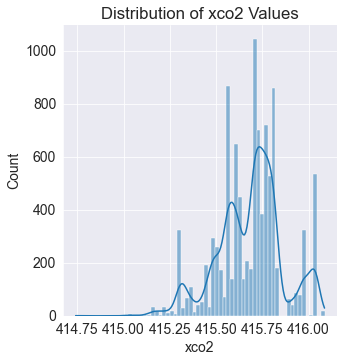

In [138]:
sns.displot(USA_prep_for['xco2'], kde = True)
plt.title('Distribution of xco2 Values');

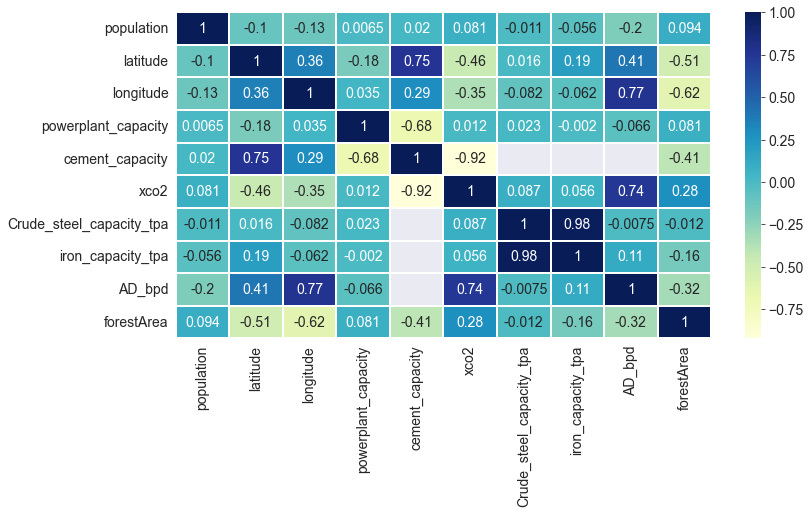

In [139]:
fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(USA_prep_for.corr(), ax=ax, cmap ="YlGnBu", linewidths = 0.1, annot = True)
plt.show()

In [140]:
USA_fin = USA_prep_for
# USA_fin = US_xco2
USA_fin

,city,admin_name,population,latitude,longitude,name,powerplant_capacity,primary_fuel,cement_capacity,xco2,Crude_steel_capacity_tpa,iron_capacity_tpa,AD_bpd,forestArea
4,Hilo,Hawaii,45056.0,19.5,-155.00,Puna Geothermal Venture I,51000000.0,Geothermal,NaN,415.605289,NaN,NaN,NaN,1748000.0
5,Hilo,Hawaii,45056.0,19.5,-155.00,Puna,39100000.0,Oil,NaN,415.605289,NaN,NaN,NaN,1748000.0
6,Hilo,Hawaii,45056.0,19.5,-155.00,W H Hill,37100000.0,Oil,NaN,415.605289,NaN,NaN,NaN,1748000.0
7,Hilo,Hawaii,45056.0,19.5,-155.00,Kanoelehua,21000000.0,Oil,NaN,415.605289,NaN,NaN,NaN,1748000.0
8,Hilo,Hawaii,45056.0,19.5,-155.00,Puueo,3100000.0,Hydro,NaN,415.605289,NaN,NaN,NaN,1748000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61273,Thief River Falls,Minnesota,9147.0,48.0,-96.25,Thief River Falls,6500000.0,Oil,NaN,415.247606,NaN,NaN,NaN,17371000.0
61287,Minot AFB,North Dakota,5312.0,48.5,-101.25,NaN,NaN,NaN,NaN,415.241694,NaN,NaN,NaN,760000.0
61298,Bellingham,Washington,130641.0,49.0,-122.50,NaN,NaN,NaN,NaN,415.646006,NaN,NaN,NaN,22435000.0
61299,Lynden,Washington,18512.0,49.0,-122.50,NaN,NaN,NaN,NaN,415.646006,NaN,NaN,NaN,22435000.0


In [141]:
USA_fin.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9979 entries, 4 to 61300
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   city                      9979 non-null   object 
 1   admin_name                9979 non-null   object 
 2   population                9979 non-null   float64
 3   latitude                  9979 non-null   float64
 4   longitude                 9979 non-null   float64
 5   name                      9734 non-null   object 
 6   powerplant_capacity       9734 non-null   float64
 7   primary_fuel              9734 non-null   object 
 8   cement_capacity           21 non-null     float64
 9   xco2                      9979 non-null   float64
 10  Crude_steel_capacity_tpa  961 non-null    float64
 11  iron_capacity_tpa         961 non-null    float64
 12  AD_bpd                    1389 non-null   float64
 13  forestArea                9979 non-null   float64
dtypes: floa

In [142]:
USA_fin.primary_fuel = USA_fin.primary_fuel.fillna("NA")
USA_fin.powerplant_capacity = USA_fin.powerplant_capacity.fillna(1)
USA_fin.cement_capacity = USA_fin.cement_capacity.fillna(1)
USA_fin.Crude_steel_capacity_tpa = USA_fin.Crude_steel_capacity_tpa.fillna(1)
USA_fin.iron_capacity_tpa = USA_fin.iron_capacity_tpa.fillna(1)
USA_fin.AD_bpd = USA_fin.AD_bpd.fillna(1)
USA_fin.forestArea = USA_fin.forestArea.fillna(1)

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\2980334138.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_fin.primary_fuel = USA_fin.primary_fuel.fillna("NA")
C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\2980334138.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  USA_fin.powerplant_capacity = USA_fin.powerplant_capacity.fillna(1)
C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_11936\2980334138.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Data

In [143]:
USA_fin.fillna(0)

,city,admin_name,population,latitude,longitude,name,powerplant_capacity,primary_fuel,cement_capacity,xco2,Crude_steel_capacity_tpa,iron_capacity_tpa,AD_bpd,forestArea
4,Hilo,Hawaii,45056.0,19.5,-155.00,Puna Geothermal Venture I,51000000.0,Geothermal,1.0,415.605289,1.0,1.0,1.0,1748000.0
5,Hilo,Hawaii,45056.0,19.5,-155.00,Puna,39100000.0,Oil,1.0,415.605289,1.0,1.0,1.0,1748000.0
6,Hilo,Hawaii,45056.0,19.5,-155.00,W H Hill,37100000.0,Oil,1.0,415.605289,1.0,1.0,1.0,1748000.0
7,Hilo,Hawaii,45056.0,19.5,-155.00,Kanoelehua,21000000.0,Oil,1.0,415.605289,1.0,1.0,1.0,1748000.0
8,Hilo,Hawaii,45056.0,19.5,-155.00,Puueo,3100000.0,Hydro,1.0,415.605289,1.0,1.0,1.0,1748000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61273,Thief River Falls,Minnesota,9147.0,48.0,-96.25,Thief River Falls,6500000.0,Oil,1.0,415.247606,1.0,1.0,1.0,17371000.0
61287,Minot AFB,North Dakota,5312.0,48.5,-101.25,0,1.0,NA,1.0,415.241694,1.0,1.0,1.0,760000.0
61298,Bellingham,Washington,130641.0,49.0,-122.50,0,1.0,NA,1.0,415.646006,1.0,1.0,1.0,22435000.0
61299,Lynden,Washington,18512.0,49.0,-122.50,0,1.0,NA,1.0,415.646006,1.0,1.0,1.0,22435000.0


In [144]:
USA_fin.city.nunique()

1422

In [145]:
import plotly
import plotly.express as px

In [146]:
map_token= 'pk.eyJ1IjoibWl0Y2hlbGxvZGlsaSIsImEiOiJjbDZkeDd4aGcwMXo0M2tvMjV1dmJ5aDFpIn0.pQ13ACndelMgJQSIYjhVIw'

In [147]:
%%time
def subsetting_coordinates(data, South, North, West, East, zoom = 1, darkmap= 0):
    
    # Create dataframe and columns
    df_xco2 = pd.DataFrame(columns=[ "latitude", "longitude", "xco2"])
    
#     df_xco2["xco2"]= data["xco2"][:]
# #     df_xco2["dateTime"]= data["time"][:]
#     df_xco2["latitude"]= data["latitude"][:]
#     df_xco2["longitude"]= data["longitude"][:]

    # Passing the new Dataframe and filtering the coordinates by region/ country: 
    df_first= USA_prep_for[(USA_prep_for["latitude"] > South) &(USA_prep_for["latitude"]< North)]
    df_second= df_first[(df_first["longitude"] >West) & (df_first["longitude"] < East)]
    
    
    # set token
    px.set_mapbox_access_token(map_token)

    fig_second= px.scatter_mapbox(df_second,
                          lat= 'latitude',
                          lon= 'longitude',
                          color= 'xco2',
                          zoom= zoom,
                          size_max= 15,
                          )
    
    if darkmap == 1:
        fig_second.update_layout(
        mapbox_style="dark",
        title='OCO2- XCO2, Atmospheric Carbon Dioxide'

        )
    else:
        fig_second.update_layout(
        mapbox_style="stamen-watercolor",
        title='OCO2- XCO2, Atmospheric Carbon Dioxide'

        )
        
    # Save HTML file offline
    plotly.offline.plot(fig_second, filename='USA_xco2.html')
    fig_second.show()

CPU times: total: 0 ns
Wall time: 0 ns


In [148]:
%%time
subsetting_coordinates(USA_prep_for, 25, 50, -125, 67, zoom= 3, darkmap = 1)

CPU times: total: 2.22 s
Wall time: 3.66 s


## Step 2. Prepare the Dataset for Training

Before we can train the model, we need to prepare the dataset. Here are the steps we'll follow:

1. Identify the input and target column(s) for training the model.
2. Identify numeric and categorical input columns.
3. [Impute](https://scikit-learn.org/stable/modules/impute.html) (fill) missing values in numeric columns
4. [Scale](https://scikit-learn.org/stable/modules/preprocessing.html#scaling-features-to-a-range) values in numeric columns to a $(0,1)$ range.
5. [Encode](https://scikit-learn.org/stable/modules/preprocessing.html#encoding-categorical-features) categorical data into one-hot vectors.
6. Split the dataset into training and validation sets.

In [149]:
USA_fin.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9979 entries, 4 to 61300
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   city                      9979 non-null   object 
 1   admin_name                9979 non-null   object 
 2   population                9979 non-null   float64
 3   latitude                  9979 non-null   float64
 4   longitude                 9979 non-null   float64
 5   name                      9734 non-null   object 
 6   powerplant_capacity       9979 non-null   float64
 7   primary_fuel              9979 non-null   object 
 8   cement_capacity           9979 non-null   float64
 9   xco2                      9979 non-null   float64
 10  Crude_steel_capacity_tpa  9979 non-null   float64
 11  iron_capacity_tpa         9979 non-null   float64
 12  AD_bpd                    9979 non-null   float64
 13  forestArea                9979 non-null   float64
dtypes: floa

### Identify Inputs and Targets

While the dataset contains 12 columns, not all of them are useful for modeling. Note the following:

- The columns `admin_name`, `name` and `city` are unique names and aren't useful for training the model.
- The column `xco2` contains the value we need to predict i.e. it's the target column. 
- Data from all the other columns can be used as inputs to the model.


In [150]:
# Identify the input columns (a list of column names)
input_cols = ['latitude', 'longitude', 'powerplant_capacity', 'primary_fuel', 'population', 'Crude_steel_capacity_tpa', 'iron_capacity_tpa', 'cement_capacity', 'AD_bpd', 'forestArea']

In [151]:
# Identify the input columns (a list of column names)
# input_cols = ['latitude', 'longitude', 'capacity_mw', 'primary_fuel', 'population', 'Cement_Production_TPA', 
#               'Crude_steel_capacity_tpa', 'iron_capacity_tpa', 'Tree_cover']

In [152]:
# Identify the name of the target column (a single string, not a list)
target_col = 'xco2'

In [153]:
print(list(input_cols))

['latitude', 'longitude', 'powerplant_capacity', 'primary_fuel', 'population', 'Crude_steel_capacity_tpa', 'iron_capacity_tpa', 'cement_capacity', 'AD_bpd', 'forestArea']


In [154]:
print(target_col)

xco2


In [155]:
inputs_df = USA_fin[input_cols].copy()

In [156]:
targets = USA_fin[target_col]

In [157]:
inputs_df

,latitude,longitude,powerplant_capacity,primary_fuel,population,Crude_steel_capacity_tpa,iron_capacity_tpa,cement_capacity,AD_bpd,forestArea
4,19.5,-155.00,51000000.0,Geothermal,45056.0,1.0,1.0,1.0,1.0,1748000.0
5,19.5,-155.00,39100000.0,Oil,45056.0,1.0,1.0,1.0,1.0,1748000.0
6,19.5,-155.00,37100000.0,Oil,45056.0,1.0,1.0,1.0,1.0,1748000.0
7,19.5,-155.00,21000000.0,Oil,45056.0,1.0,1.0,1.0,1.0,1748000.0
8,19.5,-155.00,3100000.0,Hydro,45056.0,1.0,1.0,1.0,1.0,1748000.0
...,...,...,...,...,...,...,...,...,...,...
61273,48.0,-96.25,6500000.0,Oil,9147.0,1.0,1.0,1.0,1.0,17371000.0
61287,48.5,-101.25,1.0,NA,5312.0,1.0,1.0,1.0,1.0,760000.0
61298,49.0,-122.50,1.0,NA,130641.0,1.0,1.0,1.0,1.0,22435000.0
61299,49.0,-122.50,1.0,NA,18512.0,1.0,1.0,1.0,1.0,22435000.0


In [158]:
targets

4        415.605289
5        415.605289
6        415.605289
7        415.605289
8        415.605289
            ...    
61273    415.247606
61287    415.241694
61298    415.646006
61299    415.646006
61300    415.646006
Name: xco2, Length: 9979, dtype: float64

### Identify Numeric and Categorical Data

The next step in data preparation is to identify numeric and categorical columns. We can do this by looking at the data type of each column.

In [159]:
numeric_cols = inputs_df.select_dtypes(include=['int64', 'float64']).columns.tolist()

In [160]:
categorical_cols = inputs_df.select_dtypes('object').columns.tolist()

In [161]:
print(list(numeric_cols))

['latitude', 'longitude', 'powerplant_capacity', 'population', 'Crude_steel_capacity_tpa', 'iron_capacity_tpa', 'cement_capacity', 'AD_bpd', 'forestArea']


In [162]:
print(list(categorical_cols))

['primary_fuel']


### Impute Numerical Data

Are there numeric columns in our dataset contain missing values (`nan`).

In [163]:
missing_counts = inputs_df[numeric_cols].isna().sum().sort_values(ascending=False)
missing_counts[missing_counts > 0]

Series([], dtype: int64)

Machine learning models can't work with missing data. The process of filling missing values is called [imputation](https://scikit-learn.org/stable/modules/impute.html).

<img src="https://i.imgur.com/W7cfyOp.png" width="480">

There are several techniques for imputation, but we'll use the most basic one: replacing missing values with the average value in the column using the `SimpleImputer` class from `sklearn.impute`.

In [164]:
from sklearn.impute import SimpleImputer

In [165]:
# 1. Create the imputer
imputer = SimpleImputer(strategy = 'mean')

In [166]:
# 2. Fit the imputer to the numeric colums
imputer.fit(USA_fin[numeric_cols])

SimpleImputer()

In [167]:
# 3. Transform and replace the numeric columns
inputs_df[numeric_cols] = imputer.transform(inputs_df[numeric_cols])

After imputation, none of the numeric columns should contain any missing values.

In [168]:
missing_counts = inputs_df[numeric_cols].isna().sum().sort_values(ascending=False)
missing_counts[missing_counts > 0] # should be an empty list

Series([], dtype: int64)

### Scale Numerical Values

The numeric columns in our dataset have varying ranges. 

In [169]:
inputs_df[numeric_cols].describe().loc[['min', 'max']]

,latitude,longitude,powerplant_capacity,population,Crude_steel_capacity_tpa,iron_capacity_tpa,cement_capacity,AD_bpd,forestArea
min,19.5,-155.00,1.000000e+00,5010.0,1.0,1.0,1.0,1.0,340000.0
max,49.0,-68.75,3.564000e+09,3592294.0,7254000.0,5817000.0,1800000.0,584000000.0,62425000.0


A good practice is to [scale numeric features](https://scikit-learn.org/stable/modules/preprocessing.html#scaling-features-to-a-range) to a small range of values e.g. $(0,1)$. Scaling numeric features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms also work better in practice with smaller numbers.

In [170]:
from sklearn.preprocessing import MinMaxScaler

In [171]:
# Create the scaler
scaler = MinMaxScaler()

In [172]:
# Fit the scaler to the numeric columns
scaler.fit(USA_fin[numeric_cols])

MinMaxScaler()

In [173]:
# Fit the scaler to the numeric columns
scaler.fit(USA_fin[numeric_cols])

MinMaxScaler()

In [174]:
# Transform and replace the numeric columns
inputs_df[numeric_cols] = scaler.transform(inputs_df[numeric_cols])

After scaling, the ranges of all numeric columns should be $(0, 1)$.

In [175]:
inputs_df[numeric_cols].describe().loc[['min', 'max']]

,latitude,longitude,powerplant_capacity,population,Crude_steel_capacity_tpa,iron_capacity_tpa,cement_capacity,AD_bpd,forestArea
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


### Encode Categorical Columns

Our dataset contains several categorical columns, each with a different number of categories.

In [176]:
inputs_df[categorical_cols].nunique().sort_values(ascending=False)

primary_fuel    15
dtype: int64

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers. A common technique is to use one-hot encoding for categorical columns.

<img src="https://i.imgur.com/n8GuiOO.png" width="640">

One hot encoding involves adding a new binary (0/1) column for each unique category of a categorical column.

In [177]:
from sklearn.preprocessing import OneHotEncoder

In [178]:
# 1. Create the encoder
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

In [179]:
# 2. Fit the encoder to the categorical colums

encoder.fit(USA_fin[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [180]:
# 3. Generate column names for each category
encoded_cols = list(encoder.get_feature_names(categorical_cols))
len(encoded_cols)

C:\Users\Ochibobo\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



15

In [181]:
# 4. Transform and add new one-hot category columns
inputs_df[encoded_cols] = encoder.transform(inputs_df[categorical_cols])

The new one-hot category columns should now be added to `inputs_df`.

In [182]:
inputs_df

,latitude,longitude,powerplant_capacity,primary_fuel,population,Crude_steel_capacity_tpa,iron_capacity_tpa,cement_capacity,AD_bpd,forestArea,...,primary_fuel_Hydro,primary_fuel_NA,primary_fuel_Nuclear,primary_fuel_Oil,primary_fuel_Other,primary_fuel_Petcoke,primary_fuel_Solar,primary_fuel_Storage,primary_fuel_Waste,primary_fuel_Wind
4,0.000000,0.000000,0.014310,Geothermal,0.011163,0.0,0.0,0.0,0.0,0.022679,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.000000,0.000000,0.010971,Oil,0.011163,0.0,0.0,0.0,0.0,0.022679,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.000000,0.000000,0.010410,Oil,0.011163,0.0,0.0,0.0,0.0,0.022679,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.000000,0.000000,0.005892,Oil,0.011163,0.0,0.0,0.0,0.0,0.022679,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.000000,0.000000,0.000870,Hydro,0.011163,0.0,0.0,0.0,0.0,0.022679,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61273,0.966102,0.681159,0.001824,Oil,0.001153,0.0,0.0,0.0,0.0,0.274317,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
61287,0.983051,0.623188,0.000000,NA,0.000084,0.0,0.0,0.0,0.0,0.006765,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61298,1.000000,0.376812,0.000000,NA,0.035021,0.0,0.0,0.0,0.0,0.355883,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61299,1.000000,0.376812,0.000000,NA,0.003764,0.0,0.0,0.0,0.0,0.355883,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Training and Validation Set

Finally, let's split the dataset into a training, validation and test set. We'll set aside 25% of the data as a test set. Thereafter We'll use a randomly select 25% subset of the remaining data for validation. Also, we'll use just the numeric and encoded columns, since the inputs to our model must be numbers. 

In [183]:
from sklearn.model_selection import train_test_split

In [184]:
train_val_inputs, test_inputs, train_val_targets, test_targets = train_test_split(inputs_df[numeric_cols + encoded_cols], 
                                                                        targets, 
                                                                        test_size=0.25, 
                                                                        random_state=42)

In [185]:
test_inputs

,latitude,longitude,powerplant_capacity,population,Crude_steel_capacity_tpa,iron_capacity_tpa,cement_capacity,AD_bpd,forestArea,primary_fuel_Biomass,...,primary_fuel_Hydro,primary_fuel_NA,primary_fuel_Nuclear,primary_fuel_Oil,primary_fuel_Other,primary_fuel_Petcoke,primary_fuel_Solar,primary_fuel_Storage,primary_fuel_Waste,primary_fuel_Wind
17312,0.491525,0.434783,0.000561,0.050177,0.0,0.0,0.0,0.0,0.519900,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
54356,0.779661,0.942029,0.000281,0.003162,0.0,0.0,0.0,0.0,0.300008,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
17717,0.491525,0.434783,0.000814,0.002473,0.0,0.0,0.0,0.0,0.519900,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
51143,0.762712,0.956522,0.000898,0.000047,0.0,0.0,0.0,0.0,0.043231,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17500,0.491525,0.434783,0.006706,0.001991,0.0,0.0,0.0,0.0,0.519900,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60687,0.881356,0.376812,0.004321,0.003115,0.0,0.0,0.0,0.0,0.474575,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22865,0.610169,0.898551,0.064422,0.001081,0.0,0.0,0.0,0.0,0.250737,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20305,0.542373,0.855072,0.000814,0.005358,0.0,0.0,0.0,0.0,0.293920,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
57430,0.796610,0.898551,0.002694,0.012626,0.0,0.0,0.0,0.0,0.300008,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [186]:
test_targets

17312    416.031857
54356    415.482626
17717    416.031857
51143    415.562413
17500    416.031857
            ...    
60687    415.587498
22865    415.825774
20305    415.716046
57430    415.522075
55848    415.601303
Name: xco2, Length: 2495, dtype: float64

Split the `train_val_inputs` into training and validation inputs

In [187]:
train_inputs, val_inputs, train_targets, val_targets = train_test_split(train_val_inputs[numeric_cols + encoded_cols], 
                                                                        train_val_targets, 
                                                                        test_size=0.25, 
                                                                        random_state=42)

In [188]:
train_inputs

,latitude,longitude,powerplant_capacity,population,Crude_steel_capacity_tpa,iron_capacity_tpa,cement_capacity,AD_bpd,forestArea,primary_fuel_Biomass,...,primary_fuel_Hydro,primary_fuel_NA,primary_fuel_Nuclear,primary_fuel_Oil,primary_fuel_Other,primary_fuel_Petcoke,primary_fuel_Solar,primary_fuel_Storage,primary_fuel_Waste,primary_fuel_Wind
19696,0.525424,0.840580,0.000673,0.004559,0.000000,0.0,0.0,0.000000,0.205847,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34663,0.711864,0.927536,0.002217,0.002677,0.000000,0.0,0.0,0.000000,0.264830,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
57590,0.796610,0.913043,0.000281,0.002319,0.000000,0.0,0.0,0.000000,0.300008,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2446,0.338983,0.695652,0.126263,0.003431,0.000000,0.0,0.0,0.000000,1.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
55946,0.779661,0.971014,0.023850,0.007897,0.000000,0.0,0.0,0.000000,0.043231,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2596,0.355932,0.695652,0.028058,0.002502,0.000000,0.0,0.0,1.000000,1.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28417,0.694915,0.579710,0.004209,0.018246,0.000000,0.0,0.0,0.125000,0.362358,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
45764,0.745763,0.782609,0.114254,0.019656,0.102564,0.0,0.0,0.753425,0.072320,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
32361,0.694915,0.927536,0.001571,0.000702,0.000000,0.0,0.0,0.000000,0.026158,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [189]:
train_targets

19696    415.505648
34663    415.736154
57590    415.516580
2446     415.784853
55946    415.601303
            ...    
2596     415.838404
28417    415.309450
45764    415.705425
32361    415.811941
54471    415.482626
Name: xco2, Length: 5613, dtype: float64

In [190]:
val_inputs

,latitude,longitude,powerplant_capacity,population,Crude_steel_capacity_tpa,iron_capacity_tpa,cement_capacity,AD_bpd,forestArea,primary_fuel_Biomass,...,primary_fuel_Hydro,primary_fuel_NA,primary_fuel_Nuclear,primary_fuel_Oil,primary_fuel_Other,primary_fuel_Petcoke,primary_fuel_Solar,primary_fuel_Storage,primary_fuel_Waste,primary_fuel_Wind
17552,0.491525,0.434783,0.000814,0.016488,0.0,0.0,0.0,0.0,0.519900,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
56127,0.779661,0.971014,0.001263,0.002450,0.0,0.0,0.0,0.0,0.072352,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
24194,0.644068,0.391304,0.000281,0.023078,0.0,0.0,0.0,0.0,0.519900,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
51078,0.762712,0.956522,0.000842,0.000587,0.0,0.0,0.0,0.0,0.022099,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19047,0.508475,0.434783,0.000421,0.003060,0.0,0.0,0.0,0.0,0.519900,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3660,0.423729,0.855072,0.003283,0.001291,0.0,0.0,0.0,0.0,0.393461,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22864,0.610169,0.898551,0.092593,0.001081,0.0,0.0,0.0,0.0,0.250737,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25953,0.661017,0.898551,0.019024,0.001290,0.0,0.0,0.0,0.0,0.250737,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
52645,0.762712,0.971014,0.000842,0.001997,0.0,0.0,0.0,0.0,0.043231,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [191]:
val_targets

17552    416.031857
56127    415.601303
24194    415.977939
51078    415.562413
19047    415.753164
            ...    
3660     415.735405
22864    415.825774
25953    415.760840
52645    415.633812
56917    415.400256
Name: xco2, Length: 1871, dtype: float64

## Step 3 - Train a Linear Regression Model

We're now ready to train the model. Linear regression is a commonly used technique for solving [regression problems](https://jovian.ai/aakashns/python-sklearn-logistic-regression/v/66#C6). In a linear regression model, the target is modeled as a linear combination (or weighted sum) of input features. The predictions from the model are evaluated using a loss function like the Root Mean Squared Error (RMSE).


Here's a visual summary of how a linear regression model is structured:

<img src="https://i.imgur.com/iTM2s5k.png" width="480">

However, linear regression doesn't generalize very well when we have a large number of input columns with co-linearity i.e. when the values one column are highly correlated with values in other column(s). This is because it tries to fit the training data perfectly. 

Instead, we'll use Ridge Regression, a variant of linear regression that uses a technique called L2 regularization to introduce another loss term that forces the model to generalize better. Learn more about ridge regression here: https://www.youtube.com/watch?v=Q81RR3yKn30

In [192]:
from sklearn.linear_model import Ridge, LinearRegression

In [193]:
# Create the model
model = Ridge()

In [194]:
# Fit the model using inputs and targets
model.fit(train_inputs[numeric_cols + encoded_cols], train_targets)

Ridge()

`model.fit` uses the following strategy for training the model (source):

1. We initialize a model with random parameters (weights & biases).
2. We pass some inputs into the model to obtain predictions.
3. We compare the model's predictions with the actual targets using the loss function.
4. We use an optimization technique (like least squares, gradient descent etc.) to reduce the loss by adjusting the weights & biases of the model
5. We repeat steps 1 to 4 till the predictions from the model are good enough.

<img src="https://www.deepnetts.com/blog/wp-content/uploads/2019/02/SupervisedLearning.png" width="480">

## Step 4 - Make Predictions and Evaluate Your Model

The model is now trained, and we can use it to generate predictions for the training and validation inputs. We can evaluate the model's performance using the RMSE (root mean squared error) loss function.

In [195]:
from sklearn.metrics import mean_squared_error

In [196]:
train_preds = model.predict(train_inputs)

In [197]:
train_preds

array([415.65133451, 415.65939966, 415.56133985, ..., 415.66041989,
       415.60625066, 415.57997931])

In [198]:
train_rmse = mean_squared_error(train_preds, train_targets, squared = False)

In [199]:
print('The RMSE loss for the training set is {} ppm.'.format(train_rmse))

The RMSE loss for the training set is 0.14823252847008836 ppm.


In [200]:
val_preds = model.predict(val_inputs)

In [201]:
val_preds

array([415.74215781, 415.62095858, 415.79337615, ..., 415.6594234 ,
       415.62967248, 415.64932321])

In [202]:
val_rmse = mean_squared_error(val_preds, val_targets, squared = False)

In [203]:
print('The RMSE loss for the validation set is {} ppm.'.format(val_rmse))

The RMSE loss for the validation set is 0.1417983986120276 ppm.


In [204]:
test_preds = model.predict(test_inputs)

In [205]:
test_rmse = mean_squared_error(test_preds, test_targets, squared = False)

In [206]:
print('The RMSE loss for the test set is {} ppm.'.format(test_rmse))

The RMSE loss for the test set is 0.14304093502726584 ppm.


### R-squared

In [207]:
from sklearn.metrics import r2_score

### On Validation set

In [208]:
r2 = r2_score(train_targets, train_preds)

In [209]:
print('r2 score for the model is', r2)

r2 score for the model is 0.31274547683259013


$R^2$ = 31.3%. 


In [210]:
print(f"{r2 *100:.2f}% of the variation in xco2 levels is explained by our model".format(r2))

31.27% of the variation in xco2 levels is explained by our model


### On test set

In [211]:
test_r2 = r2_score(test_targets, test_preds)

In [212]:
print('r2 score for the model is', test_r2)

r2 score for the model is 0.33075552817809173


In [213]:
print(f"{test_r2 *100:.2f}% of the variation in xco2 levels is explained by our model".format(test_r2))

33.08% of the variation in xco2 levels is explained by our model


$R^2$ = 33.0%. 

### Feature Importance

Let's look at the weights assigned to different columns, to figure out which columns in the dataset are the most important.

In [214]:
weights = model.coef_

Let's create a dataframe to view the weight assigned to each column.

In [215]:
weights_df = pd.DataFrame({
    'columns': train_inputs.columns,
    'weight': weights
}).sort_values('weight', ascending=False)

In [216]:
weights_df

,columns,weight
16,primary_fuel_Nuclear,0.135136
17,primary_fuel_Oil,0.106812
20,primary_fuel_Solar,0.086428
4,Crude_steel_capacity_tpa,0.075621
10,primary_fuel_Coal,0.068722
12,primary_fuel_Gas,0.064237
22,primary_fuel_Waste,0.057861
3,population,0.030907
21,primary_fuel_Storage,0.027100
9,primary_fuel_Biomass,0.021465


### Making Predictions

The model can be used to make predictions on new inputs using the following helper function:

In [217]:
def predict_input(single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numeric_cols] = imputer.transform(input_df[numeric_cols])
    input_df[numeric_cols] = scaler.transform(input_df[numeric_cols])
    input_df[encoded_cols] = encoder.transform(input_df[categorical_cols].values)
    X_input = input_df[numeric_cols + encoded_cols]
    return model.predict(X_input)[0]

In [218]:
sample_input = { 'latitude': 23, 'longitude': 70, 'powerplant_capacity' : 4300 * 1e6, 'primary_fuel' : 'Coal', 'population': 31200 , 
                'cement_capacity' : 1e6, 'Crude_steel_capacity_tpa' : 500000, 'iron_capacity_tpa' : 0, 'AD_bpd' : 23 * 1e6, 'forestArea' : 2000 * 1e3}

In [219]:
predicted_xco2 = predict_input(sample_input)

C:\Users\Ochibobo\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but OneHotEncoder was fitted with feature names



In [220]:
print('The predicted xco2 above the powerplant is {} ppm'.format(predicted_xco2))

The predicted xco2 above the powerplant is 415.2954731166269 ppm


### Saving the model

Let's save the model (along with other useful objects) to disk, so that we use it for making predictions without retraining.

In [221]:
# import joblib

In [222]:
# xco2_predictor = {
#     'model': model,
#     'imputer': imputer,
#     'scaler': scaler,
# #     'encoder': encoder,
#     'input_cols': input_cols,
#     'target_col': target_col,
#     'numeric_cols': numeric_cols,
#     'categorical_cols': categorical_cols,
#     'encoded_cols': encoded_cols
# }

In [223]:
# joblib.dump(xco2_predictor, 'xco2_predictor.joblib')

## ## Training and Visualizing Decision Trees

A decision tree in general parlance represents a hierarchical series of binary decisions:

<img src="https://i.imgur.com/qSH4lqz.png" width="480">

A decision tree in machine learning works in exactly the same way, and except that we let the computer figure out the optimal structure & hierarchy of decisions, instead of coming up with criteria manually.

### Decision Tree Regressor

We can use `DecisionTreeRegressor` from `sklearn.tree` to train a decision tree.

In [224]:
from sklearn.tree import DecisionTreeRegressor

In [225]:
dt_model = DecisionTreeRegressor(random_state = 42)

In [226]:
%%time
dt_model.fit(train_inputs[numeric_cols + encoded_cols], train_targets)

CPU times: total: 31.2 ms
Wall time: 33.3 ms


DecisionTreeRegressor(random_state=42)

An optimal decision tree has now been created using the training data.

### Prediction

We can now make predictions and evaluate the model using `dt_model.predict`.

In [227]:
train_preds_dt = dt_model.predict(train_inputs)
train_preds_dt

array([415.50564805, 415.73615405, 415.51658029, ..., 415.70542544,
       415.81194114, 415.48262595])

#### Evaluation

Let's evaluate the decision tree using the `RMSE`.

In [228]:
from sklearn.metrics import mean_squared_error

def rmse(a, b):
    return mean_squared_error(a, b, squared=False)

In [229]:
rmse(train_preds_dt, train_targets)

5.518220010965109e-13

In [230]:
# validation data
val_preds_dt = dt_model.predict(val_inputs)
rmse(val_preds_dt, val_targets)

0.019223842198574235

In [231]:
# test data
test_preds_dt = dt_model.predict(test_inputs)
rmse(test_preds_dt, test_targets)

0.021883853998591385

We can make predictions and compute accuracy in one step using model.score. Let's check the accuracy of its predictions.

In [232]:
#validation data
dt_model.score(val_inputs, val_targets)

0.9880273765130076

In [233]:
#test data
dt_model.score(test_inputs, test_targets)

0.9843356734176616

The accuracy on the validation set is 99% & test set is 98.9%. Interesting. Model.score => R-squared

### R-squared

In [234]:
dt_val_r2 = r2_score(val_targets, val_preds_dt)
print(f"{dt_val_r2 *100:.2f}% of the variation in xco2 levels in our validation set is explained by our model".format(dt_val_r2))

98.80% of the variation in xco2 levels in our validation set is explained by our model


In [235]:
dt_test_r2 = r2_score(test_targets, test_preds_dt)
print(f"{dt_test_r2 *100:.2f}% of the variation in xco2 levels in our test set is explained by our model".format(dt_test_r2))

98.43% of the variation in xco2 levels in our test set is explained by our model


### Visualization

We can visualize the decision tree _learned_ from the training data.

In [236]:
from sklearn.tree import plot_tree, export_text

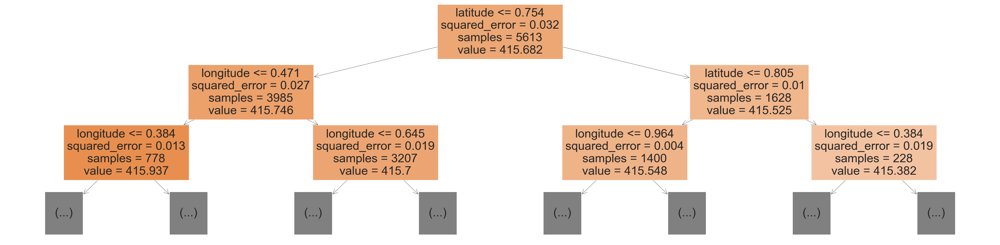

In [237]:
plt.figure(figsize = (80,20))
plot_tree(dt_model, feature_names = train_inputs.columns, max_depth =2, filled = True);

We can also display the tree as text, which can be easier to follow for deeper trees.

In [238]:
tree_text = export_text(dt_model, max_depth=10, feature_names=list(train_inputs.columns))
print(tree_text[:5000])

|--- latitude <= 0.75
|   |--- longitude <= 0.47
|   |   |--- longitude <= 0.38
|   |   |   |--- latitude <= 0.31
|   |   |   |   |--- value: [415.61]
|   |   |   |--- latitude >  0.31
|   |   |   |   |--- latitude <= 0.64
|   |   |   |   |   |--- latitude <= 0.62
|   |   |   |   |   |   |--- value: [415.78]
|   |   |   |   |   |--- latitude >  0.62
|   |   |   |   |   |   |--- value: [415.79]
|   |   |   |   |--- latitude >  0.64
|   |   |   |   |   |--- population <= 0.00
|   |   |   |   |   |   |--- value: [415.73]
|   |   |   |   |   |--- population >  0.00
|   |   |   |   |   |   |--- value: [415.78]
|   |   |--- longitude >  0.38
|   |   |   |--- latitude <= 0.50
|   |   |   |   |--- longitude <= 0.44
|   |   |   |   |   |--- primary_fuel_Waste <= 0.50
|   |   |   |   |   |   |--- longitude <= 0.43
|   |   |   |   |   |   |   |--- value: [416.07]
|   |   |   |   |   |   |--- longitude >  0.43
|   |   |   |   |   |   |   |--- value: [416.03]
|   |   |   |   |   |--- primary_fuel_W

### Feature Importance

Based on the gini index computations, a decision tree assigns an "importance" value to each feature. These values can be used to interpret the results given by a decision tree.

In [239]:
dt_model.feature_importances_

array([4.25245345e-01, 5.33542155e-01, 2.94321574e-03, 1.53846039e-03,
       4.22018527e-04, 0.00000000e+00, 5.96141923e-03, 1.15295981e-02,
       1.21901078e-02, 1.08123806e-05, 2.26199676e-05, 3.25990924e-08,
       1.13894168e-04, 0.00000000e+00, 5.67121900e-03, 3.36537299e-04,
       0.00000000e+00, 1.16596680e-07, 0.00000000e+00, 0.00000000e+00,
       7.77563385e-05, 3.13545780e-04, 4.86119582e-05, 3.25336773e-05])

Let's turn this into a dataframe and visualize the most important features.

In [240]:
importance_df = pd.DataFrame({
    'feature': train_inputs.columns,
    'importance': dt_model.feature_importances_
}).sort_values('importance', ascending = False)

In [241]:
importance_df

,feature,importance
1,longitude,5.335422e-01
0,latitude,4.252453e-01
8,forestArea,1.219011e-02
7,AD_bpd,1.152960e-02
6,cement_capacity,5.961419e-03
14,primary_fuel_Hydro,5.671219e-03
2,powerplant_capacity,2.943216e-03
3,population,1.538460e-03
4,Crude_steel_capacity_tpa,4.220185e-04
15,primary_fuel_NA,3.365373e-04


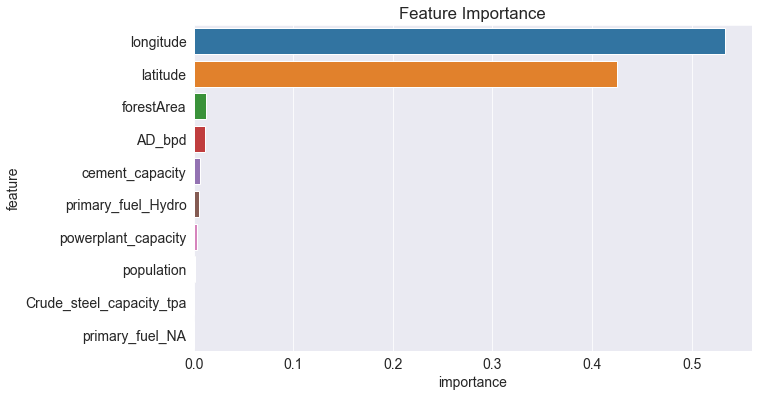

In [242]:
plt.title('Feature Importance')
sns.barplot(data = importance_df.head(10), x = 'importance', y = 'feature');

#### Hyperparameter Tuning and Overfitting

In [243]:
?DecisionTreeRegressor

These arguments are called hyperparameters because they must be configured manually (as opposed to the parameters within the model which are _learned_ from the data. We'll explore a couple of hyperparameters:

- `max_depth`
- `max_leaf_nodes`

In [244]:
dt_model = DecisionTreeRegressor(max_depth=3, random_state=42)

In [245]:
dt_model.fit(train_inputs, train_targets)

DecisionTreeRegressor(max_depth=3, random_state=42)

We can compute the accuracy of the model on the training and validation sets using `dt_model.score`

In [246]:
dt_model.score(train_inputs, train_targets)

0.7974951187104817

In [247]:
dt_model.score(val_inputs, val_targets)

0.7941465207931501

Let's experiment with different depths using a helper function.

In [248]:
def max_depth_error(md):
    model = DecisionTreeRegressor(max_depth=md, random_state=42)
    model.fit(train_inputs, train_targets)
    train_err = 1 - model.score(train_inputs, train_targets)
    val_err = 1 - model.score(val_inputs, val_targets)
    return {'Max Depth': md, 'Training Error': train_err, 'Validation Error': val_err}

In [249]:
%%time
errors_df = pd.DataFrame([max_depth_error(md) for md in range(1, 21)])

CPU times: total: 594 ms
Wall time: 635 ms


In [250]:
errors_df

,Max Depth,Training Error,Validation Error
0,1,6.850058e-01,0.650466
1,2,4.596160e-01,0.421963
2,3,2.025049e-01,0.205853
3,4,1.587270e-01,0.154641
4,5,1.100746e-01,0.108644
5,6,8.025456e-02,0.083926
6,7,6.423516e-02,0.071178
7,8,4.379205e-02,0.058455
8,9,2.677395e-02,0.041371
9,10,1.095519e-02,0.024062


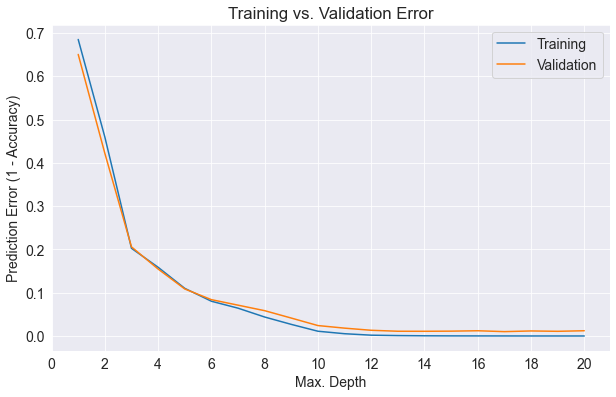

In [251]:
plt.figure()
plt.plot(errors_df['Max Depth'], errors_df['Training Error'])
plt.plot(errors_df['Max Depth'], errors_df['Validation Error'])
plt.title('Training vs. Validation Error')
plt.xticks(range(0,21, 2))
plt.xlabel('Max. Depth')
plt.ylabel('Prediction Error (1 - Accuracy)')
plt.legend(['Training', 'Validation']);

This is a common pattern you'll see with all machine learning algorithms:

<img src="https://i.imgur.com/EJCrSZw.png" width="480">



You'll often need to tune hyperparameters carefully to find the optimal fit. In the above case, it appears that a maximum depth of 5 results in the lowest validation error.

In [252]:
dt_model = DecisionTreeRegressor(max_depth=15, random_state=42).fit(train_inputs, train_targets)
dt_model.score(val_inputs, val_targets)

0.9888491267856492

An improvement over a max depth of 3 

### `max_leaf_nodes`

Another way to control the size of complexity of a decision tree is to limit the number of leaf nodes. This allows branches of the tree to have varying depths. 

In [253]:
dt_model = DecisionTreeRegressor(max_leaf_nodes=128, random_state=42)

In [254]:
dt_model.fit(train_inputs, train_targets)

DecisionTreeRegressor(max_leaf_nodes=128, random_state=42)

In [255]:
dt_model.score(train_inputs, train_targets)

0.9958501518063102

In [256]:
dt_model.score(val_inputs, val_targets)

0.9846656610591724

In [257]:
dt_model.tree_.max_depth

14

Notice that the model was able to achieve a greater depth of 18 for certain paths while keeping other paths shorter.

In [258]:
dt_model_text = export_text(dt_model, feature_names=list(train_inputs.columns))
print(dt_model_text[:3000])

|--- latitude <= 0.75
|   |--- longitude <= 0.47
|   |   |--- longitude <= 0.38
|   |   |   |--- forestArea <= 0.27
|   |   |   |   |--- value: [415.61]
|   |   |   |--- forestArea >  0.27
|   |   |   |   |--- value: [415.79]
|   |   |--- longitude >  0.38
|   |   |   |--- latitude <= 0.50
|   |   |   |   |--- longitude <= 0.44
|   |   |   |   |   |--- value: [416.03]
|   |   |   |   |--- longitude >  0.44
|   |   |   |   |   |--- latitude <= 0.48
|   |   |   |   |   |   |--- value: [415.78]
|   |   |   |   |   |--- latitude >  0.48
|   |   |   |   |   |   |--- value: [415.68]
|   |   |   |--- latitude >  0.50
|   |   |   |   |--- longitude <= 0.40
|   |   |   |   |   |--- latitude <= 0.62
|   |   |   |   |   |   |--- latitude <= 0.59
|   |   |   |   |   |   |   |--- value: [415.69]
|   |   |   |   |   |   |--- latitude >  0.59
|   |   |   |   |   |   |   |--- value: [415.84]
|   |   |   |   |   |--- latitude >  0.62
|   |   |   |   |   |   |--- latitude <= 0.65
|   |   |   |   |   |  

## Putting it Together and Making Predictions

Let's train a final model on the entire training set with tree depth of 15

In [259]:
dt_model = DecisionTreeRegressor(max_depth=15, random_state=42).fit(train_inputs, train_targets)

Now that the model is trained, we can make predictions on the test set.

In [260]:
test_preds_dt = dt_model.predict(test_inputs)

In [261]:
dt_test_r2 = r2_score(test_targets, test_preds_dt)
print(f"{dt_test_r2 *100:.2f}% of the variation in xco2 levels in our test set is explained by our model".format(dt_test_r2))

98.35% of the variation in xco2 levels in our test set is explained by our model


$R^2$ = 98.4%. 

## Training a Random Forest

While tuning the hyperparameters of a single decision tree may lead to some improvements, a much more effective strategy is to combine the results of several decision trees trained with slightly different parameters. This is called a random forest model. 

The key idea here is that each decision tree in the forest will make different kinds of errors, and upon averaging, many of their errors will cancel out. This idea is also commonly known as the "wisdom of the crowd":

<img src="https://i.imgur.com/4Dg0XK4.png" width="480">

A random forest works by averaging/combining the results of several decision trees:

<img src="https://1.bp.blogspot.com/-Ax59WK4DE8w/YK6o9bt_9jI/AAAAAAAAEQA/9KbBf9cdL6kOFkJnU39aUn4m8ydThPenwCLcBGAsYHQ/s0/Random%2BForest%2B03.gif" width="640">


We'll use the `RandomForestRegressor` class from `sklearn.ensemble`.

In [262]:
from sklearn.ensemble import RandomForestRegressor

In [263]:
rf_model = RandomForestRegressor(n_jobs = -1, random_state=42)

`n_jobs` allows the random forest to use mutiple parallel workers to train decision trees, and `random_state=42` ensures that the we get the same results for each execution (fix the randomness).

In [264]:
%%time
rf_model.fit(train_inputs, train_targets)

CPU times: total: 2.34 s
Wall time: 887 ms


RandomForestRegressor(n_jobs=-1, random_state=42)

In [265]:
rf_model.score(train_inputs, train_targets)

0.9986640762692828

In [266]:
rf_model.score(val_inputs, val_targets)

0.9927078189976338

The training accuracy is almost 100%, but this time the validation accuracy is much better. In fact, it is better than the best single decision tree we had trained so far. Do you see the power of random forests?

This general technique of combining the results of many models is called "ensembling", it works because most errors of individual models cancel out on averaging. Here's what it looks like visually:

<img src="https://i.imgur.com/qJo8D8b.png" width="640">

We can can access individual decision trees using `model.estimators_`

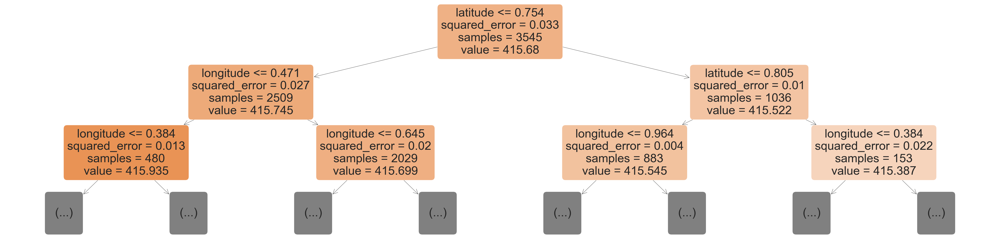

In [267]:
plt.figure(figsize=(80,20))
plot_tree(rf_model.estimators_[0], max_depth=2, feature_names=train_inputs.columns, filled=True, rounded=True);

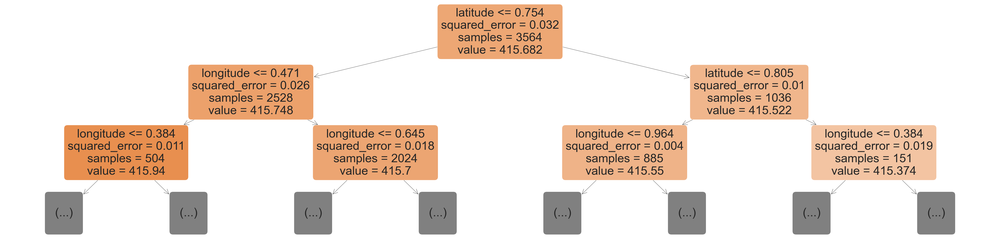

In [268]:
plt.figure(figsize=(80,20))
plot_tree(rf_model.estimators_[3], max_depth=2, feature_names=train_inputs.columns, filled=True, rounded=True);

In [269]:
len(rf_model.estimators_)

100

Just like decision tree, random forests also assign an "importance" to each feature, by combining the importance values from individual trees.

In [270]:
importance_df = pd.DataFrame({
    'feature': train_inputs.columns,
    'importance': rf_model.feature_importances_
}).sort_values('importance', ascending=False)

In [271]:
importance_df

,feature,importance
1,longitude,4.744198e-01
0,latitude,3.995285e-01
8,forestArea,8.874700e-02
7,AD_bpd,1.057971e-02
14,primary_fuel_Hydro,7.439265e-03
3,population,4.781331e-03
6,cement_capacity,4.230903e-03
2,powerplant_capacity,3.930063e-03
4,Crude_steel_capacity_tpa,2.289276e-03
12,primary_fuel_Gas,1.183628e-03


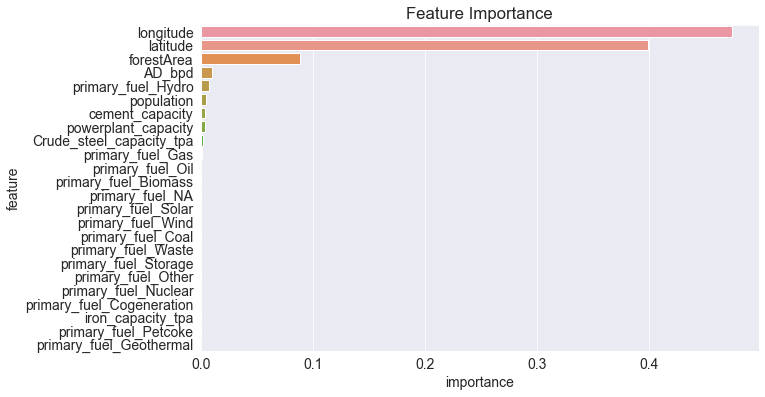

In [272]:
plt.title('Feature Importance')
sns.barplot(data=importance_df, x='importance', y='feature');

## Hyperparameter Tuning with Random Forests

Just like decision trees, random forests also have several hyperparameters. In fact many of these hyperparameters are applied to the underlying decision trees. 

Let's study some the hyperparameters for random forests. You can learn more about them here: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html

In [273]:
?RandomForestRegressor

In [274]:
base_model = RandomForestRegressor(random_state = 42, n_jobs = -1).fit(train_inputs, train_targets)

In [275]:
base_train_acc = base_model.score(train_inputs, train_targets)
base_val_acc = base_model.score(val_inputs, val_targets)

In [276]:
base_accs = base_train_acc, base_val_acc
base_accs

(0.9986640762692828, 0.9927078189976346)

We can use this as a benchmark for hyperparmeter tuning. Parameters whose accuracy is indicated above

### `n_estimators`

This argument controls the number of decision trees in the random forest. The default value is 100. For larger datasets, it helps to have a greater number of estimators. As a general rule, try to have as few estimators as needed. 


**10 estimators**

In [277]:
rf_model = RandomForestRegressor(random_state=42, n_jobs=-1, n_estimators=10)

In [278]:
rf_model.fit(train_inputs, train_targets)

RandomForestRegressor(n_estimators=10, n_jobs=-1, random_state=42)

In [279]:
rf_model.score(train_inputs, train_targets), rf_model.score(val_inputs, val_targets)

(0.9980677799977135, 0.9912383715049098)

In [280]:
base_accs

(0.9986640762692828, 0.9927078189976346)

### `max_depth` and `max_leaf_nodes`

These arguments are passed directly to each decision tree, and control the maximum depth and max. no leaf nodes of each tree respectively. By default, no maximum depth is specified, which is why each tree has a training accuracy of 100%. You can specify a `max_depth` to reduce overfitting.

<img src="https://i.imgur.com/EJCrSZw.png" width="480">

In [281]:
def test_params(**params):
    model = RandomForestRegressor(random_state=42, n_jobs=-1, **params).fit(train_inputs, train_targets)
    return model.score(train_inputs, train_targets), model.score(val_inputs, val_targets)

Let's test a few values of `max_depth` and `max_leaf_nodes`.

In [282]:
test_params(max_depth=5)

(0.9008942691741058, 0.9036701963990859)

In [283]:
test_params(max_depth=26)

(0.9986640762692827, 0.9927078189976329)

In [284]:
test_params(max_leaf_nodes=2**5)

(0.9547341508962615, 0.9516219491253095)

In [285]:
test_params(max_leaf_nodes=2**20)

(0.9986739684494462, 0.9925160378850046)

In [286]:
base_accs # no max depth or max leaf nodes

(0.9986640762692828, 0.9927078189976346)

The optimal values of `max_depth` and `max_leaf_nodes` lies somewhere between 0 and unbounded.

### Putting it together

Let's train a random forest with customized hyperparameters based on our learnings. Of course, different hyperparams

In [287]:
rf_model = RandomForestRegressor(n_jobs=-1, max_leaf_nodes=2**20, random_state=42)

In [288]:
%%time
rf_model.fit(train_inputs, train_targets)

CPU times: total: 4.22 s
Wall time: 1.8 s


RandomForestRegressor(max_leaf_nodes=1048576, n_jobs=-1, random_state=42)

Now that the model is trained, we can make predictions on the test set.

In [289]:
test_preds_rf = rf_model.predict(test_inputs)
rf_test_r2 = r2_score(test_targets, test_preds_rf)
print(f"{rf_test_r2 *100:.2f}% of the variation in xco2 levels in our test set is explained by our model".format(rf_test_r2))

99.06% of the variation in xco2 levels in our test set is explained by our model


In [290]:
rf_model.score(test_inputs, test_targets)

0.9905855311036785

$R^2$ = 99.1%. 